In [1]:
import prior

dataset = prior.load_dataset("procthor-10k")
dataset

[AI2-THOR WARNING] There has been an update to ProcTHOR-10K that must be used with AI2-THOR version 5.0+. To use the new version of ProcTHOR-10K, please update AI2-THOR to version 5.0+ by running:
    pip install --upgrade ai2thor
Alternatively, to downgrade to the old version of ProcTHOR-10K, run:
   prior.load_dataset("procthor-10k", revision="ab3cacd0fc17754d4c080a3fd50b18395fae8647")


Loading test: 100%|██████████| 1000/1000 [00:00<00:00, 12093.26it/s]


DatasetDict(
    train=Dataset(
    dataset=procthor-dataset,
    size=10000,
    split=train
),
    val=Dataset(
    dataset=procthor-dataset,
    size=1000,
    split=val
),
    test=Dataset(
    dataset=procthor-dataset,
    size=1000,
    split=test
)
)

In [2]:
from ai2thor.controller import Controller


house = dataset["train"][3]
controller = Controller(scene=house, snapToGrid=False, rotateStepDegrees=30)
event = controller.step("Pass")
spawn = event.metadata["agent"]["position"]

/home/juyuanli/miniconda3/envs/nav_assistant/lib/python3.11/site-packages/ai2thor/platform.py:154: UserWarning: could not connect to X Display: 5, Can't connect to display ":5": b'Authorization required, but no authorization protocol specified\n'
  warnings.warn(


In [3]:
import numpy as np
def teleport(controller, target=None):
    event = controller.step("GetReachablePositions")
    reachable_positions = event.metadata["actionReturn"]
    # Pick a random target
    if target is None:
        target = np.random.choice(reachable_positions)

    event = controller.step(
        action="TeleportFull",
        x=target["x"],
        y=target["y"],
        z=target["z"],
        rotation={"x": 0, "y": 0, "z": 0},
        horizon=0,
        standing=True
    )

    return event


In [4]:
from rl import PPO, ActorCritic, Env, RolloutBuffer, ClipEnv, CLIPNovelty
from models import LSTMActor, LSTMCritic, FrozenResNetEncoder, SlidingWindowTransformerActor, SlidingWindowTransformerCritic
from cons import MINIBATCHES, EPISODE_STEPS, FEAT_DIM, NUM_ACTIONS, DEVICE

In [5]:
import torch
import matplotlib.pyplot as plt
from rl import save_actor_critic

def train(controller, name: str, ppo: PPO, env: Env, actor_critic: ActorCritic, total_updates=10):
    event = controller.step("Pass")  # prime
    rewards = []
    episode_rewards = []
    for upd in range(total_updates):
        buf = RolloutBuffer()
        for mb in range(MINIBATCHES):
            # collect episodes
            episode_seq = []
            episode_reward = 0
            actions_seq = []
            for t in range(1, EPISODE_STEPS + 1):
                with torch.no_grad():
                    obs_t = ppo.obs_from_event(event)  # (C,H,W)
                    obs_t_encoded = actor_critic.actor_critic_encoder(obs_t.unsqueeze(0).unsqueeze(0)).squeeze(0).squeeze(0)
                    obs_seq = torch.stack(episode_seq + [obs_t_encoded], dim=0).unsqueeze(0).to(device=DEVICE)

                if len(actions_seq) == 0:
                    actions_seq.append(torch.randint(0, NUM_ACTIONS, (1, 1)).item())
                
                actions_tensor = torch.tensor(actions_seq, dtype=torch.long, device=DEVICE).unsqueeze(0)
                logits, value = ppo.act_and_value(obs_seq, actions_tensor, actor_critic)
                dist = torch.distributions.Categorical(logits=logits)
                action_idx = dist.sample()
                logp = dist.log_prob(action_idx)
                
                action_idx, logp = action_idx.item(), logp.item()
                event, reward = env.step_env(controller, action_idx)
                done = t == EPISODE_STEPS

                # store one step
                buf.add(obs_t_encoded, action_idx, logp, reward, value, done)
                episode_seq.append(obs_t_encoded)
                rewards.append(reward)
                actions_seq.append(action_idx)
                
                episode_reward += reward / EPISODE_STEPS

                # 50% chance of teleport
                if done:
                    env.reset()
                    if np.random.rand() > 0.5:
                        event = teleport(controller)
            episode_rewards.append(episode_reward)
                
        ppo.ppo_update(buf, actor_critic)
        save_actor_critic(actor_critic, name)
        
        print(f"Update {upd+1}/{total_updates} — steps: {len(buf)}")
        plt.plot(rewards)
        plt.show()
        plt.plot(episode_rewards)
        plt.show()
    return buf, rewards

In [6]:
ENTROPY_COEF = 0.05

ppo = PPO(ENTROPY_COEF)
encoder = FrozenResNetEncoder()
actor = SlidingWindowTransformerActor(FEAT_DIM, NUM_ACTIONS)
critic = SlidingWindowTransformerCritic(FEAT_DIM)
clip_novelty = CLIPNovelty()
clip_env = ClipEnv(clip_novelty)
clip_actor_critic = ActorCritic(encoder, actor, critic)


[PPO] Epoch 0: Loss=110.3871, Policy=0.0077, Value=220.7808
[PPO] Epoch 10: Loss=104.0297, Policy=0.0000, Value=208.0850
[PPO] Epoch 20: Loss=33.5355, Policy=-0.0088, Value=67.1154
[PPO] Epoch 30: Loss=28.7234, Policy=-0.0182, Value=57.5142
Approx KL Learned: 0.09646904468536377
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 1/100 — steps: 4096


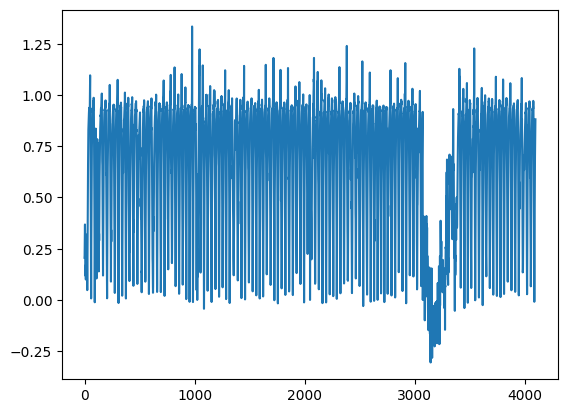

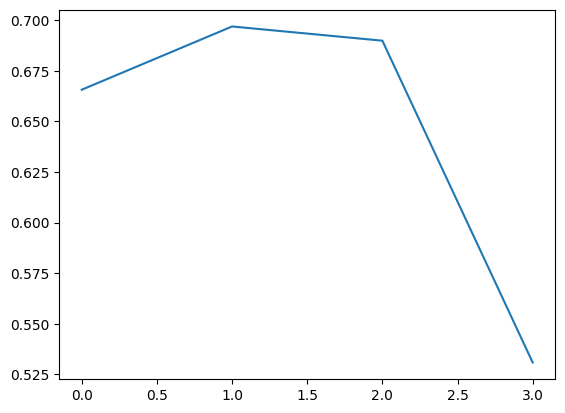

[PPO] Epoch 0: Loss=116.8427, Policy=0.0070, Value=233.7589
[PPO] Epoch 10: Loss=55.6736, Policy=0.0058, Value=111.4214
[PPO] Epoch 20: Loss=51.7646, Policy=-0.0108, Value=103.6375
[PPO] Epoch 30: Loss=46.8905, Policy=-0.0157, Value=93.8985
Approx KL Learned: 0.021229233592748642
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 2/100 — steps: 4096


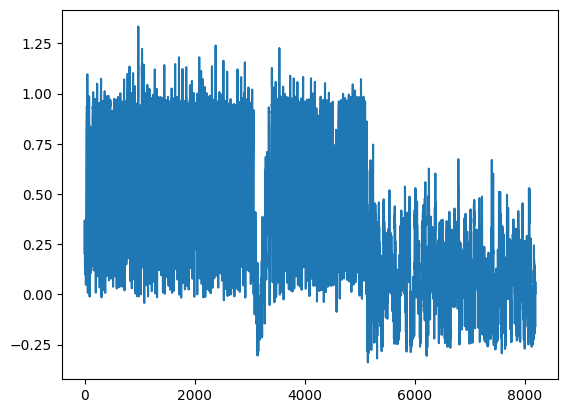

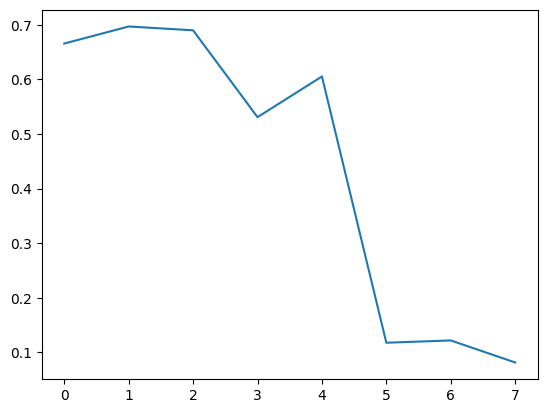

[PPO] Epoch 0: Loss=99.8642, Policy=0.0025, Value=199.7737
[PPO] Epoch 10: Loss=47.2553, Policy=-0.0030, Value=94.5652
[PPO] Epoch 20: Loss=38.3602, Policy=-0.0151, Value=76.7999
[PPO] Epoch 30: Loss=28.4399, Policy=-0.0211, Value=56.9720
Approx KL Learned: 0.0437176451086998
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 3/100 — steps: 4096


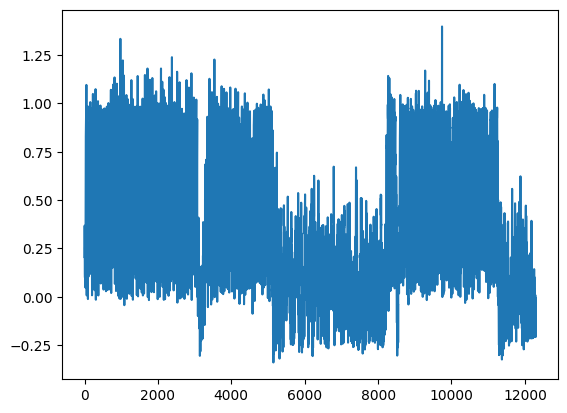

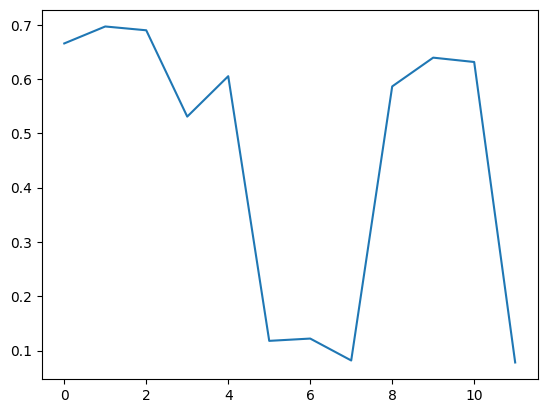

[PPO] Epoch 0: Loss=69.5631, Policy=0.0042, Value=139.1650
[PPO] Epoch 10: Loss=36.3800, Policy=-0.0064, Value=72.8176
[PPO] Epoch 20: Loss=32.8784, Policy=-0.0209, Value=65.8432
[PPO] Epoch 30: Loss=29.1680, Policy=-0.0331, Value=58.4467
Approx KL Learned: 0.03985174745321274
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 4/100 — steps: 4096


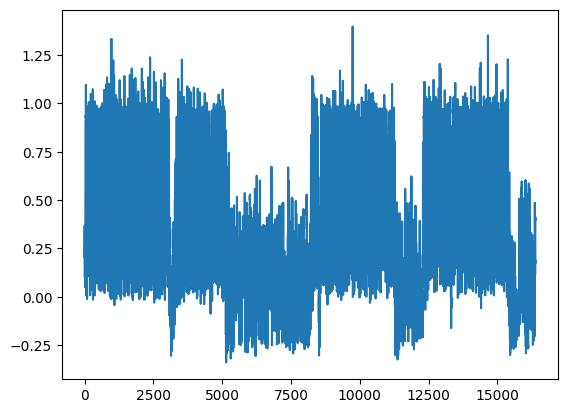

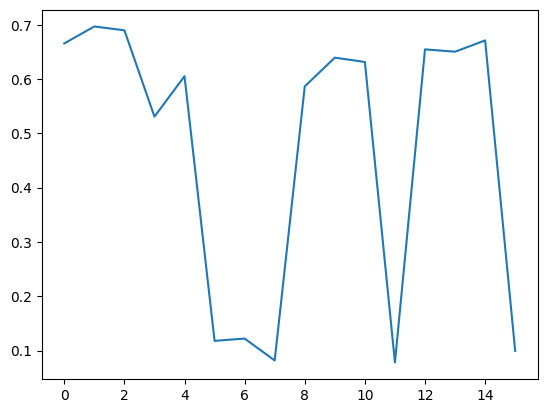

[PPO] Epoch 0: Loss=58.5752, Policy=0.0050, Value=117.2046
[PPO] Epoch 10: Loss=40.3033, Policy=-0.0102, Value=80.6903
[PPO] Epoch 20: Loss=37.1154, Policy=-0.0246, Value=74.3420
[PPO] Epoch 30: Loss=34.7758, Policy=-0.0407, Value=69.6945
Approx KL Learned: 0.04763004928827286
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 5/100 — steps: 4096


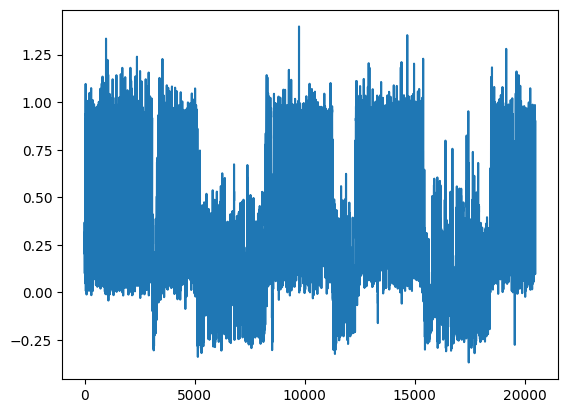

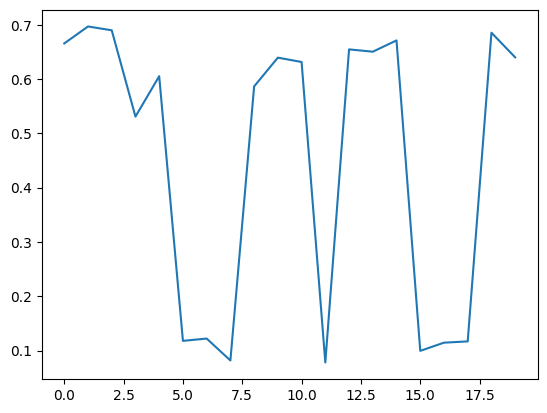

[PPO] Epoch 0: Loss=64.9815, Policy=0.0063, Value=129.9898
[PPO] Epoch 10: Loss=40.1180, Policy=-0.0006, Value=80.2782
[PPO] Epoch 20: Loss=33.6987, Policy=-0.0087, Value=67.4567
[PPO] Epoch 30: Loss=30.7963, Policy=-0.0220, Value=61.6786
Approx KL Learned: 0.05715445801615715
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 6/100 — steps: 4096


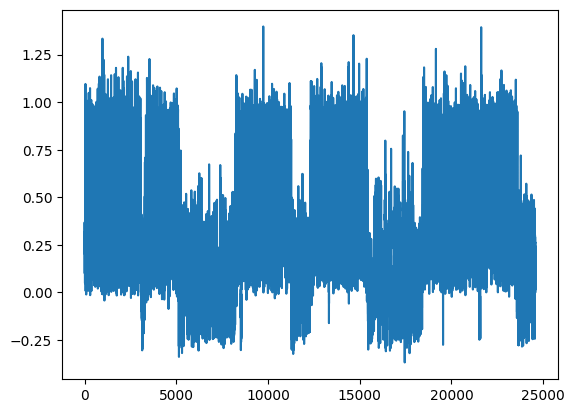

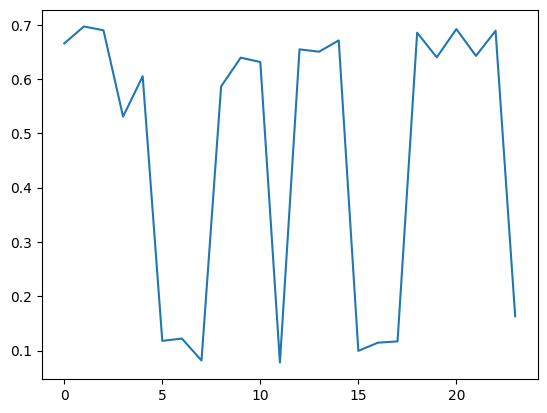

[PPO] Epoch 0: Loss=222.4243, Policy=0.0090, Value=444.9328
[PPO] Epoch 10: Loss=115.8778, Policy=0.0025, Value=231.8530
[PPO] Epoch 20: Loss=89.2118, Policy=-0.0140, Value=178.5526
[PPO] Epoch 30: Loss=67.5878, Policy=-0.0275, Value=135.3320
Approx KL Learned: 0.021253731101751328
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 7/100 — steps: 4096


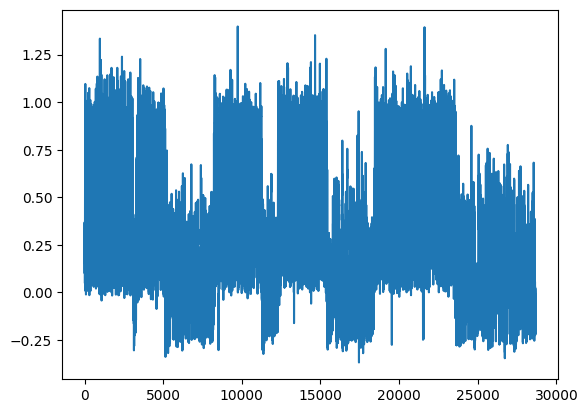

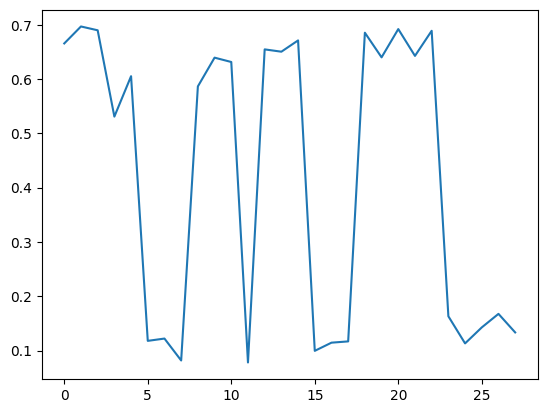

[PPO] Epoch 0: Loss=145.4040, Policy=0.0067, Value=290.8425
[PPO] Epoch 10: Loss=90.9305, Policy=0.0051, Value=181.8985
[PPO] Epoch 20: Loss=65.0243, Policy=-0.0013, Value=130.0985
[PPO] Epoch 30: Loss=50.3815, Policy=-0.0054, Value=100.8215
Approx KL Learned: 0.028569189831614494
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 8/100 — steps: 4096


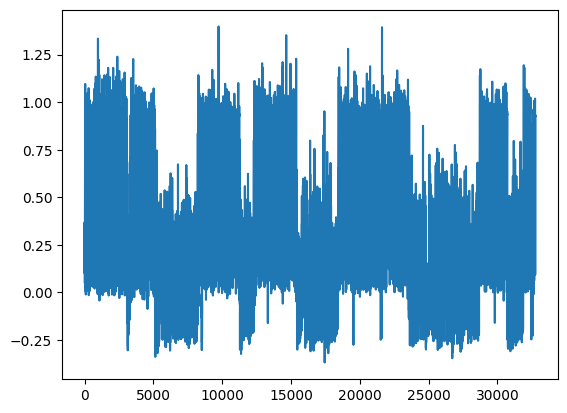

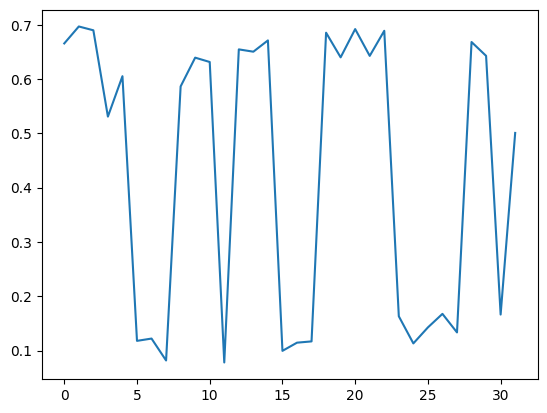

[PPO] Epoch 0: Loss=19.2378, Policy=0.0079, Value=38.4830
[PPO] Epoch 10: Loss=13.7356, Policy=-0.0052, Value=27.5013
[PPO] Epoch 20: Loss=11.6784, Policy=-0.0088, Value=23.3954
[PPO] Epoch 30: Loss=10.9241, Policy=0.0497, Value=21.7656
Approx KL Learned: 0.0807819813489914
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 9/100 — steps: 4096


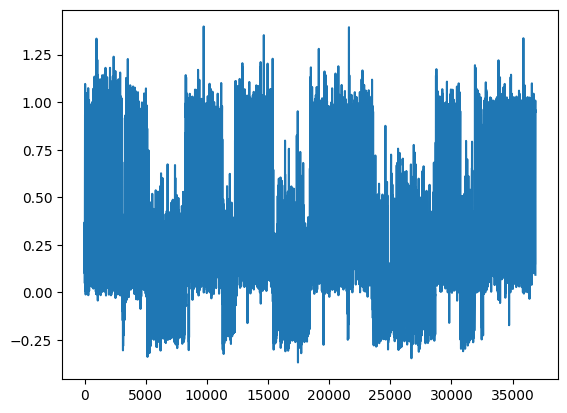

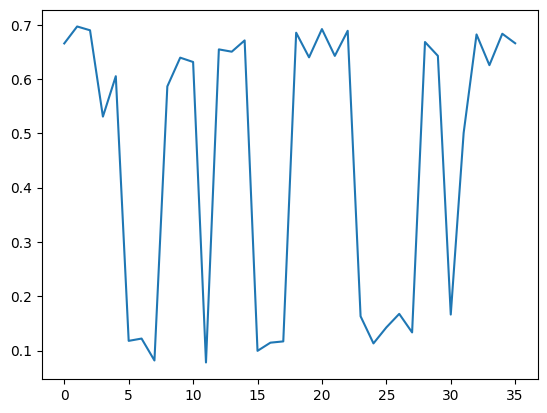

[PPO] Epoch 0: Loss=173.7466, Policy=0.0076, Value=347.5517
[PPO] Epoch 10: Loss=90.2966, Policy=0.0340, Value=180.6100
[PPO] Epoch 20: Loss=63.9893, Policy=0.0110, Value=128.0349
[PPO] Epoch 30: Loss=47.4338, Policy=-0.0134, Value=94.9705
Approx KL Learned: 0.03631122410297394
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 10/100 — steps: 4096


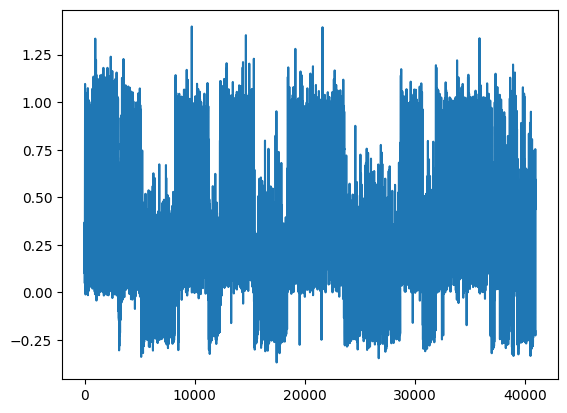

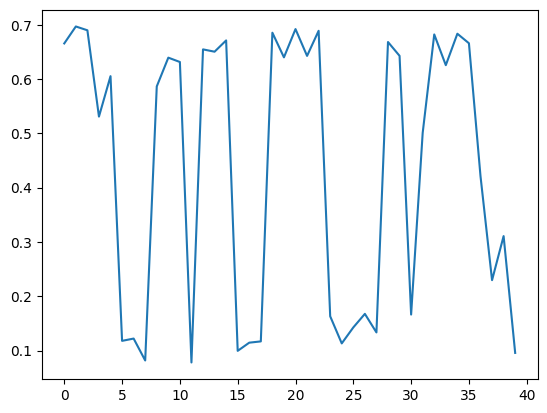

[PPO] Epoch 0: Loss=133.9048, Policy=0.0040, Value=267.8858
[PPO] Epoch 10: Loss=78.7528, Policy=0.0009, Value=157.5865
[PPO] Epoch 20: Loss=47.9705, Policy=-0.0138, Value=96.0519
[PPO] Epoch 30: Loss=33.2016, Policy=-0.0228, Value=66.5329
Approx KL Learned: 0.032576870173215866
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 11/100 — steps: 4096


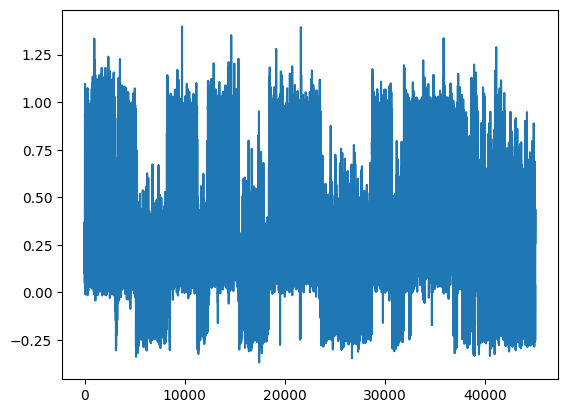

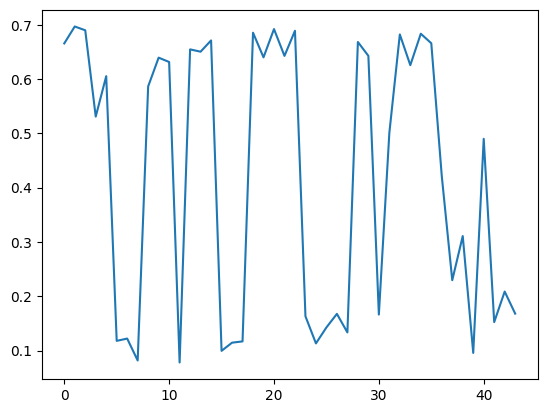

[PPO] Epoch 0: Loss=86.3455, Policy=0.0046, Value=172.7094
[PPO] Epoch 10: Loss=30.0927, Policy=0.0002, Value=60.2113
[PPO] Epoch 20: Loss=24.3400, Policy=-0.0074, Value=48.7210
[PPO] Epoch 30: Loss=21.3335, Policy=-0.0147, Value=42.7231
Approx KL Learned: 0.015454065054655075
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 12/100 — steps: 4096


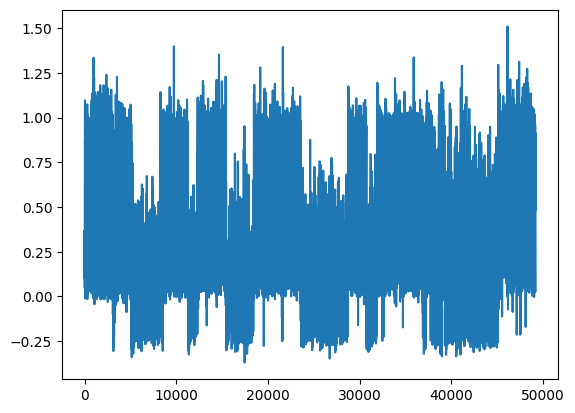

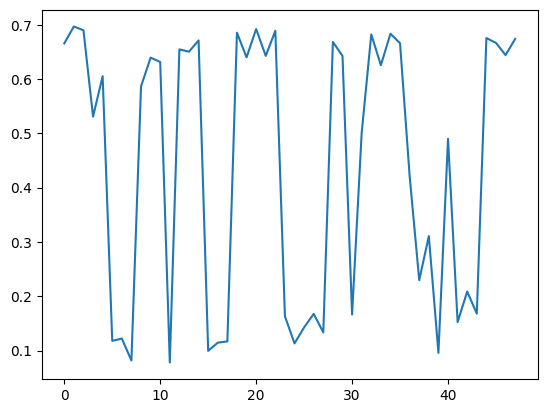

[PPO] Epoch 0: Loss=84.2419, Policy=0.0066, Value=168.5334
[PPO] Epoch 10: Loss=40.1224, Policy=0.0034, Value=80.3014
[PPO] Epoch 20: Loss=27.1137, Policy=-0.0107, Value=54.3118
[PPO] Epoch 30: Loss=20.5828, Policy=-0.0194, Value=41.2674
Approx KL Learned: 0.04263004660606384
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 13/100 — steps: 4096


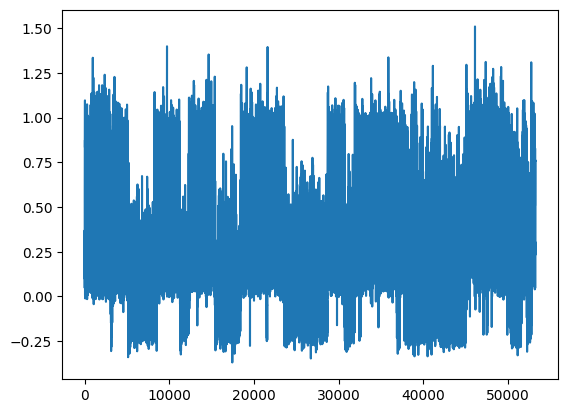

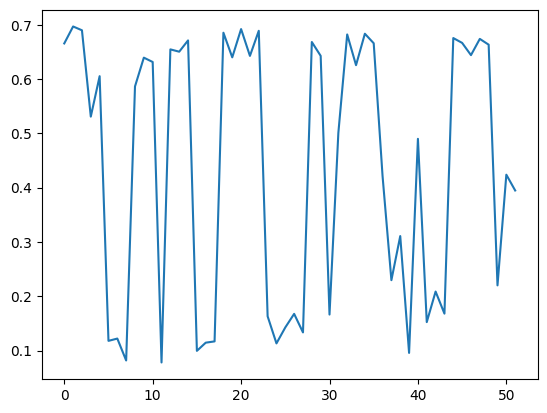

[PPO] Epoch 0: Loss=83.9270, Policy=0.0025, Value=167.8748
[PPO] Epoch 10: Loss=33.4215, Policy=-0.0061, Value=66.8801
[PPO] Epoch 20: Loss=21.7755, Policy=-0.0171, Value=43.6099
[PPO] Epoch 30: Loss=15.6696, Policy=-0.0261, Value=31.4185
Approx KL Learned: 0.04270431026816368
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 14/100 — steps: 4096


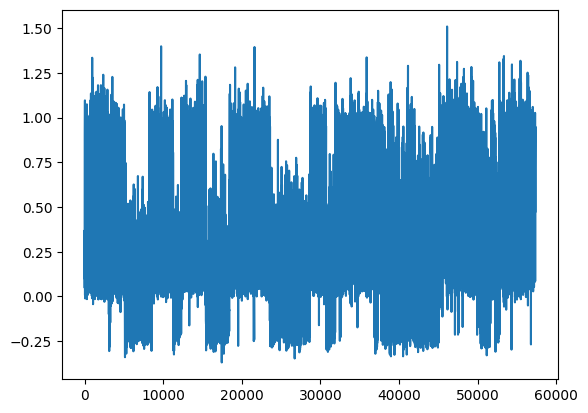

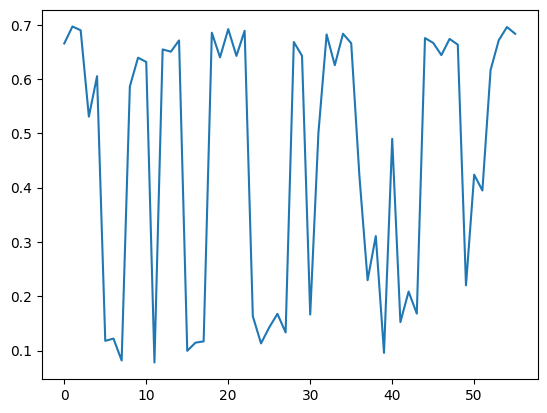

[PPO] Epoch 0: Loss=60.8540, Policy=0.0054, Value=121.7559
[PPO] Epoch 10: Loss=29.2800, Policy=-0.0022, Value=58.6218
[PPO] Epoch 20: Loss=19.0974, Policy=-0.0200, Value=38.2918
[PPO] Epoch 30: Loss=12.5991, Policy=-0.0334, Value=25.3222
Approx KL Learned: 0.07536153495311737
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 15/100 — steps: 4096


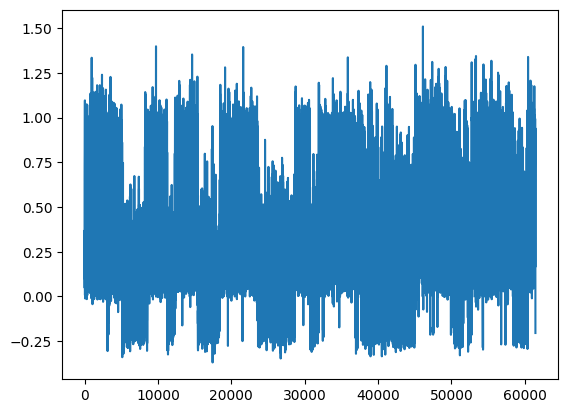

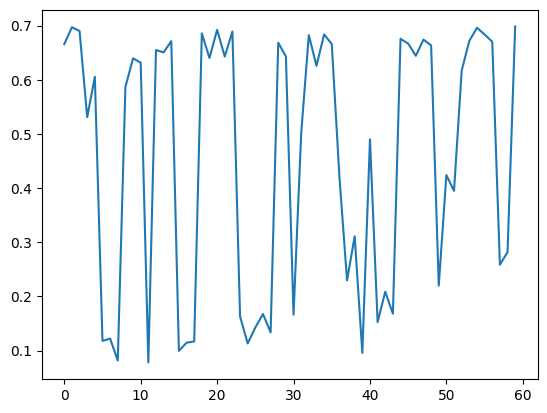

[PPO] Epoch 0: Loss=87.3008, Policy=0.0068, Value=174.6102
[PPO] Epoch 10: Loss=31.2738, Policy=0.0123, Value=62.5445
[PPO] Epoch 20: Loss=17.7601, Policy=-0.0009, Value=35.5438
[PPO] Epoch 30: Loss=14.7699, Policy=0.0001, Value=29.5596
Approx KL Learned: 0.02231370285153389
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 16/100 — steps: 4096


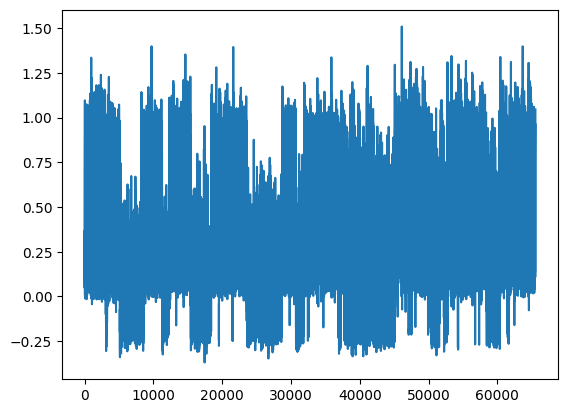

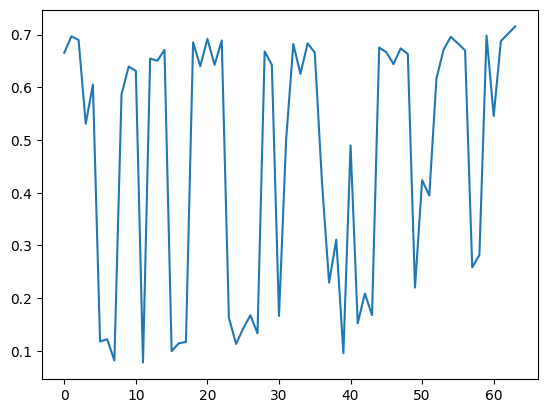

[PPO] Epoch 0: Loss=46.0999, Policy=0.0025, Value=92.2096
[PPO] Epoch 10: Loss=19.7521, Policy=-0.0027, Value=39.5233
[PPO] Epoch 20: Loss=12.5677, Policy=-0.0078, Value=25.1678
[PPO] Epoch 30: Loss=7.8007, Policy=-0.0122, Value=15.6444
Approx KL Learned: 0.10980448126792908
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 17/100 — steps: 4096


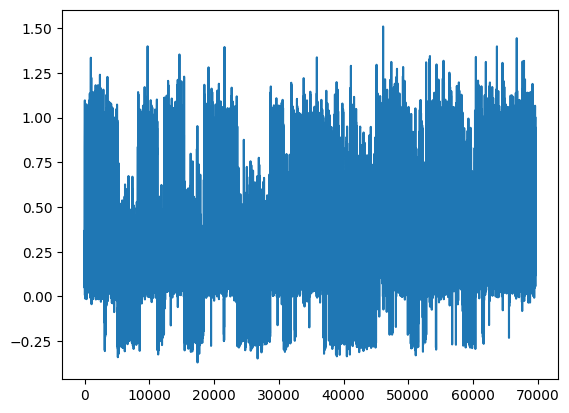

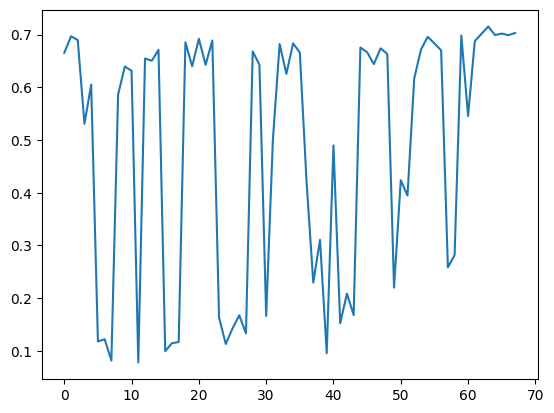

[PPO] Epoch 0: Loss=82.3591, Policy=0.0098, Value=164.7588
[PPO] Epoch 10: Loss=48.2709, Policy=0.0152, Value=96.5648
[PPO] Epoch 20: Loss=32.0994, Policy=-0.0114, Value=64.2763
[PPO] Epoch 30: Loss=22.4773, Policy=-0.0191, Value=45.0543
Approx KL Learned: 0.03766781464219093
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 18/100 — steps: 4096


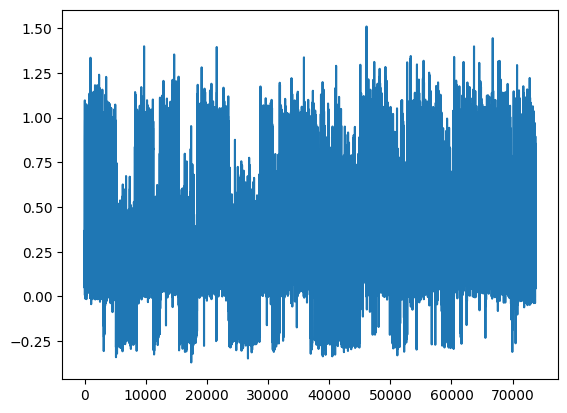

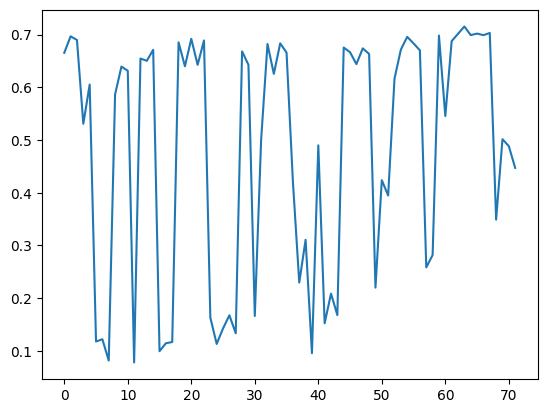

[PPO] Epoch 0: Loss=43.8563, Policy=0.0068, Value=87.7501
[PPO] Epoch 10: Loss=32.5400, Policy=-0.0005, Value=65.1293
[PPO] Epoch 20: Loss=22.7947, Policy=-0.0105, Value=45.6591
[PPO] Epoch 30: Loss=20.3039, Policy=-0.0223, Value=40.7061
Approx KL Learned: 0.04434114694595337
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 19/100 — steps: 4096


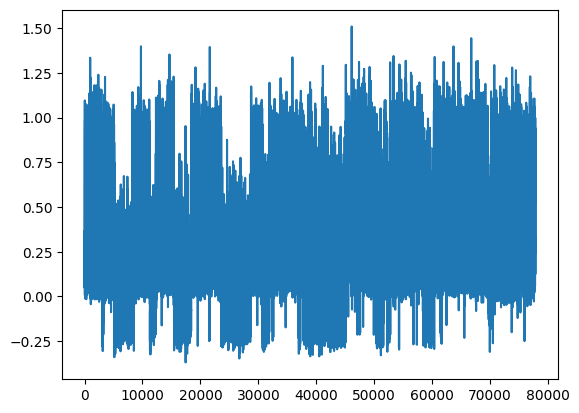

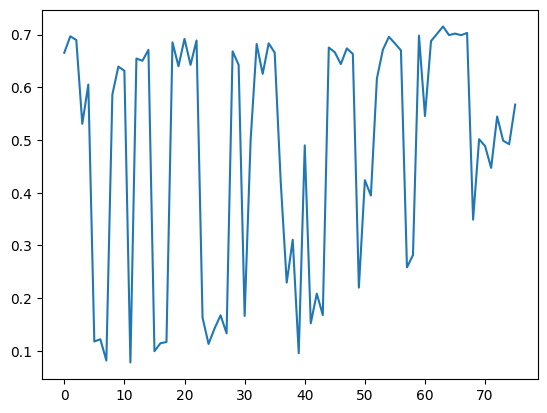

[PPO] Epoch 0: Loss=70.3359, Policy=0.0046, Value=140.7384
[PPO] Epoch 10: Loss=30.8817, Policy=-0.0069, Value=61.8485
[PPO] Epoch 20: Loss=20.5183, Policy=-0.0226, Value=41.1548
[PPO] Epoch 30: Loss=14.3512, Policy=-0.0383, Value=28.8495
Approx KL Learned: 0.04378838092088699
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 20/100 — steps: 4096


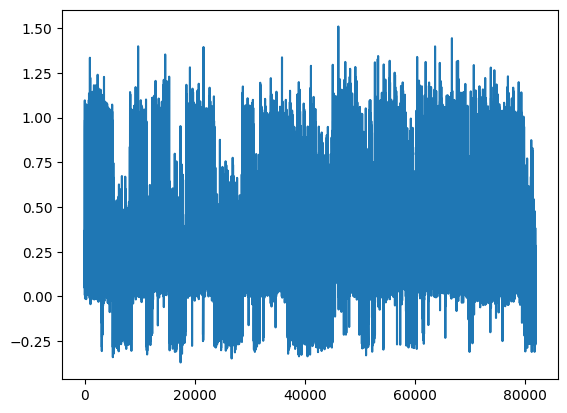

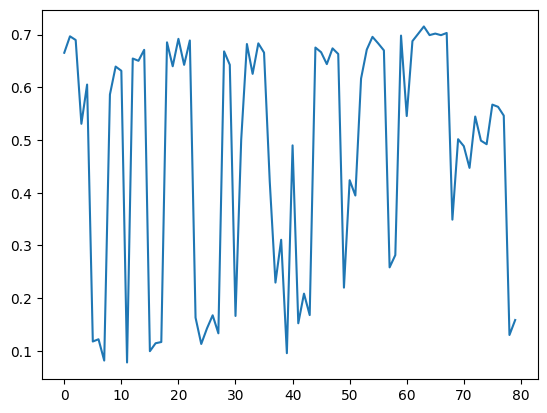

[PPO] Epoch 0: Loss=87.8430, Policy=0.0068, Value=175.7567
[PPO] Epoch 10: Loss=42.8698, Policy=-0.0018, Value=85.8269
[PPO] Epoch 20: Loss=28.4489, Policy=-0.0168, Value=57.0144
[PPO] Epoch 30: Loss=22.6336, Policy=-0.0317, Value=45.4123
Approx KL Learned: 0.0337296724319458
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 21/100 — steps: 4096


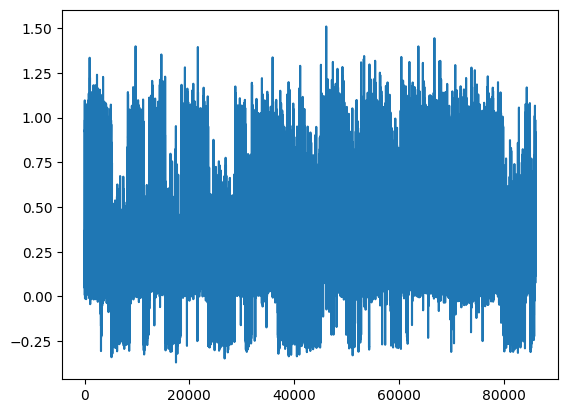

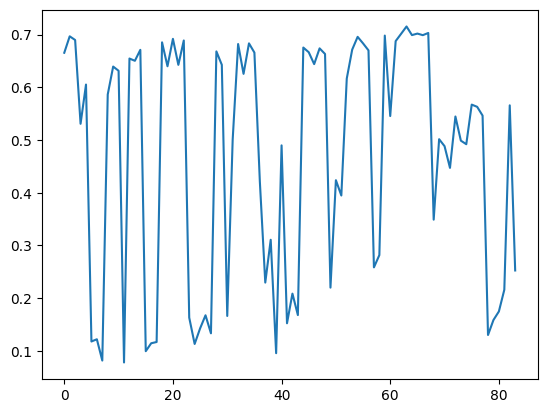

[PPO] Epoch 0: Loss=96.9256, Policy=0.0033, Value=193.8753
[PPO] Epoch 10: Loss=40.8740, Policy=0.0008, Value=81.7731
[PPO] Epoch 20: Loss=15.9901, Policy=-0.0079, Value=32.0279
[PPO] Epoch 30: Loss=13.8790, Policy=-0.0154, Value=27.8201
Approx KL Learned: 0.04918871074914932
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 22/100 — steps: 4096


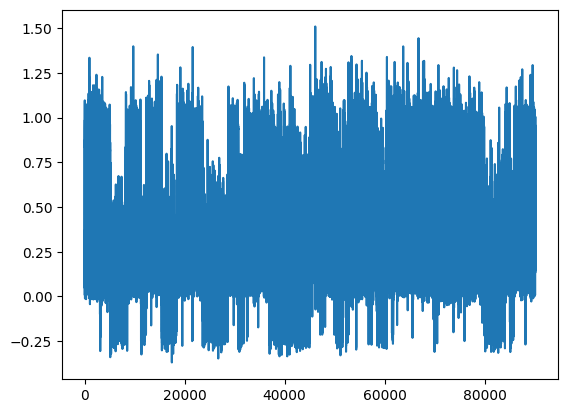

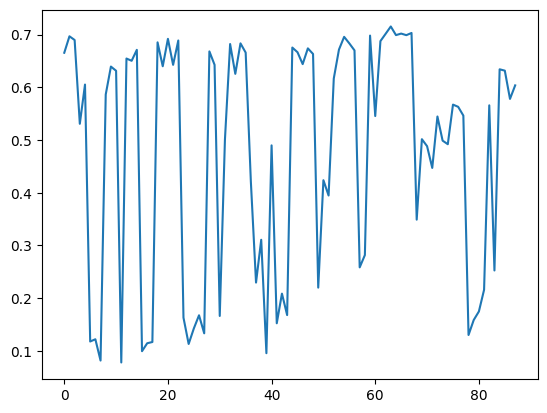

[PPO] Epoch 0: Loss=58.4303, Policy=0.0108, Value=116.8756
[PPO] Epoch 10: Loss=37.3598, Policy=0.0411, Value=74.6694
[PPO] Epoch 20: Loss=20.2435, Policy=0.0031, Value=40.5127
[PPO] Epoch 30: Loss=13.2465, Policy=-0.0058, Value=26.5416
Approx KL Learned: 0.056739404797554016
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 23/100 — steps: 4096


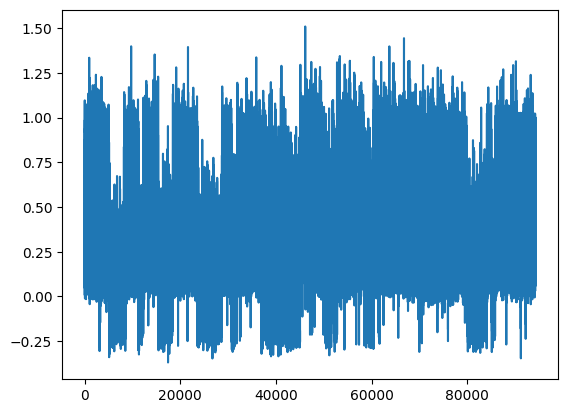

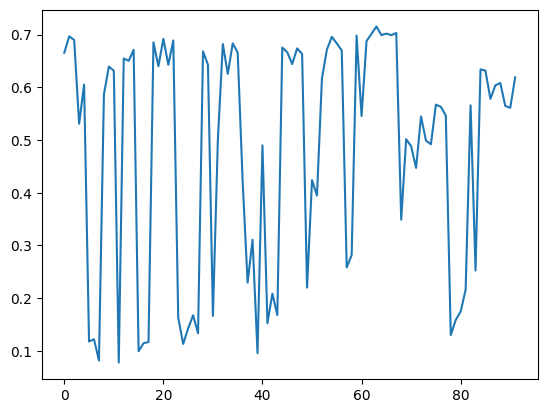

[PPO] Epoch 0: Loss=74.0796, Policy=0.0041, Value=148.2049
[PPO] Epoch 10: Loss=30.1269, Policy=0.0068, Value=60.2908
[PPO] Epoch 20: Loss=19.4054, Policy=-0.0164, Value=38.8956
[PPO] Epoch 30: Loss=12.6230, Policy=-0.0343, Value=25.3652
Approx KL Learned: 0.04535170644521713
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 24/100 — steps: 4096


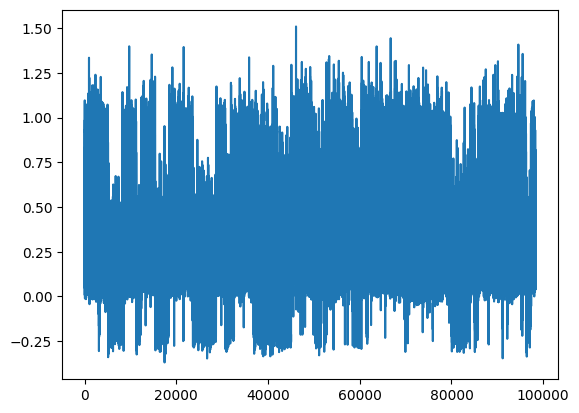

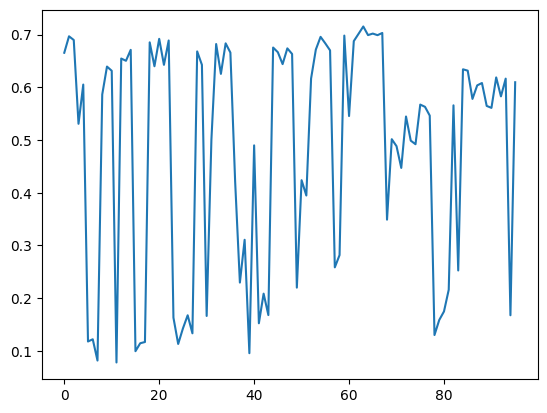

[PPO] Epoch 0: Loss=67.2858, Policy=0.0045, Value=134.6021
[PPO] Epoch 10: Loss=28.7133, Policy=-0.0051, Value=57.4723
[PPO] Epoch 20: Loss=19.9930, Policy=-0.0206, Value=40.0625
[PPO] Epoch 30: Loss=15.0098, Policy=-0.0311, Value=30.1172
Approx KL Learned: 0.037739820778369904
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 25/100 — steps: 4096


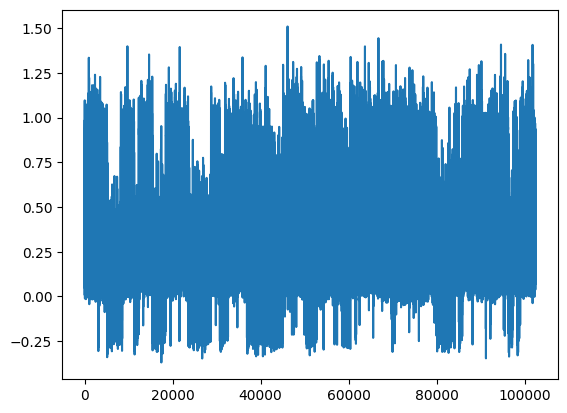

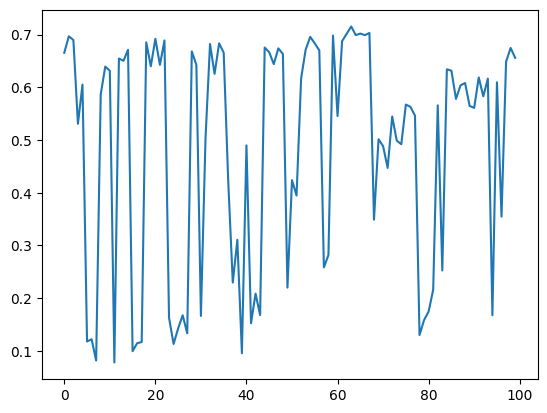

[PPO] Epoch 0: Loss=58.9508, Policy=0.0054, Value=117.9180
[PPO] Epoch 10: Loss=40.9052, Policy=-0.0025, Value=81.8426
[PPO] Epoch 20: Loss=20.5923, Policy=-0.0144, Value=41.2417
[PPO] Epoch 30: Loss=12.0217, Policy=-0.0188, Value=24.1144
Approx KL Learned: 0.038437727838754654
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 26/100 — steps: 4096


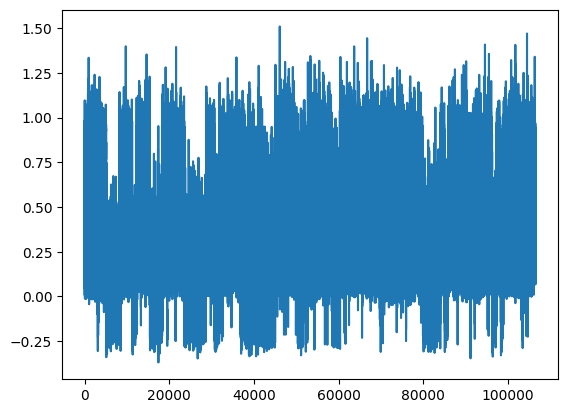

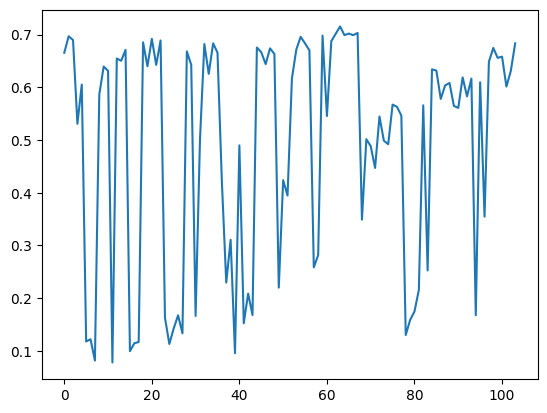

[PPO] Epoch 0: Loss=210.4267, Policy=0.0096, Value=420.9355
[PPO] Epoch 10: Loss=97.2314, Policy=0.0078, Value=194.5500
[PPO] Epoch 20: Loss=65.7775, Policy=-0.0040, Value=131.6658
[PPO] Epoch 30: Loss=47.5844, Policy=-0.0171, Value=95.3053
Approx KL Learned: 0.0255068838596344
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 27/100 — steps: 4096


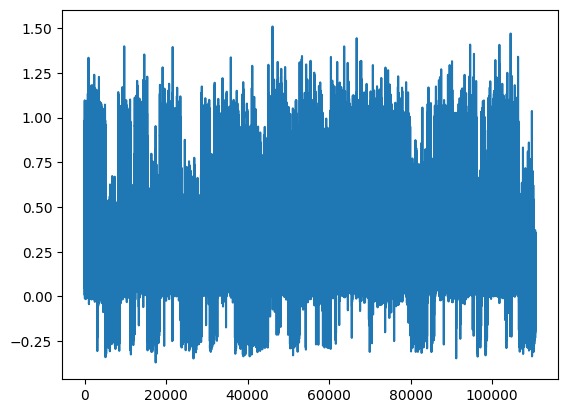

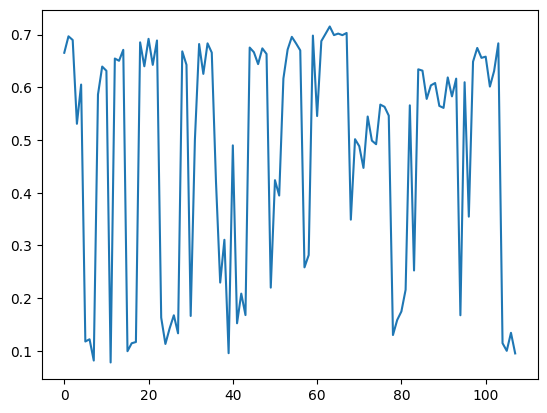

[PPO] Epoch 0: Loss=108.4270, Policy=0.0117, Value=216.9097
[PPO] Epoch 10: Loss=54.0975, Policy=-0.0006, Value=108.2743
[PPO] Epoch 20: Loss=29.7141, Policy=-0.0179, Value=59.5412
[PPO] Epoch 30: Loss=18.4811, Policy=-0.0352, Value=37.1105
Approx KL Learned: 0.05786518380045891
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 28/100 — steps: 4096


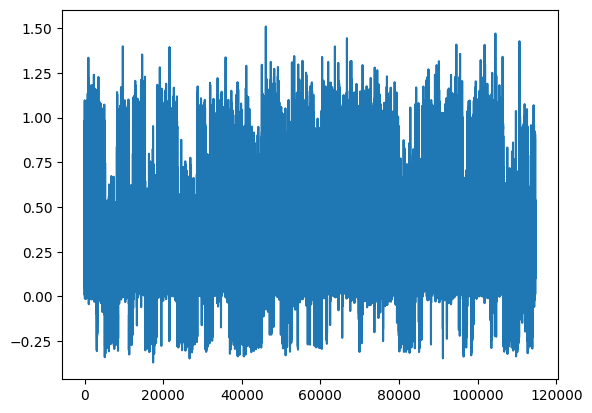

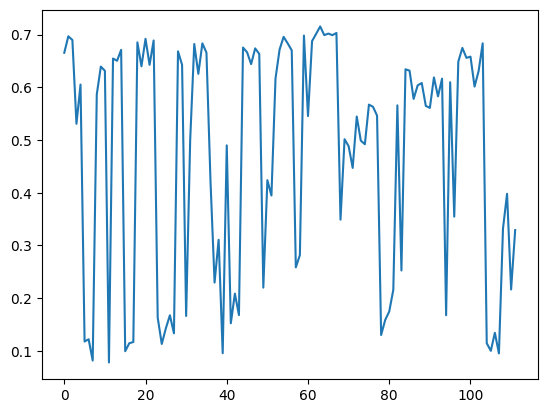

[PPO] Epoch 0: Loss=92.5882, Policy=0.0116, Value=185.2224
[PPO] Epoch 10: Loss=61.3376, Policy=0.0051, Value=122.7321
[PPO] Epoch 20: Loss=44.2851, Policy=-0.0115, Value=88.6604
[PPO] Epoch 30: Loss=32.8281, Policy=-0.0154, Value=65.7572
Approx KL Learned: 0.03540458530187607
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 29/100 — steps: 4096


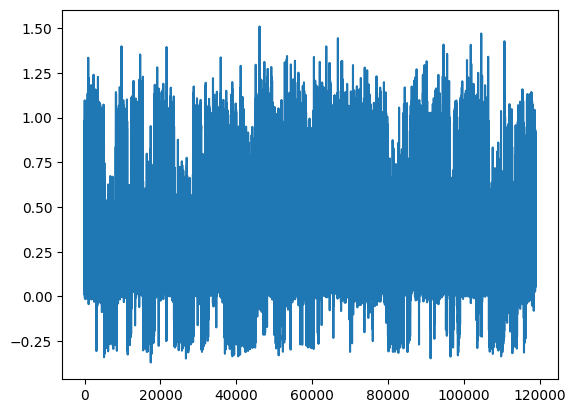

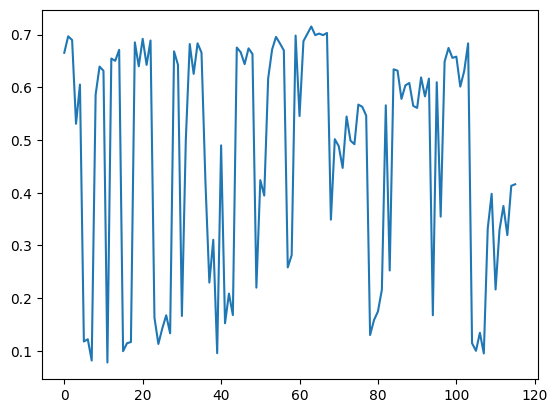

[PPO] Epoch 0: Loss=78.9534, Policy=0.0110, Value=157.9406
[PPO] Epoch 10: Loss=55.9590, Policy=-0.0040, Value=111.9753
[PPO] Epoch 20: Loss=48.5358, Policy=-0.0118, Value=97.1481
[PPO] Epoch 30: Loss=37.7204, Policy=-0.0165, Value=75.5269
Approx KL Learned: 0.03386305645108223
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 30/100 — steps: 4096


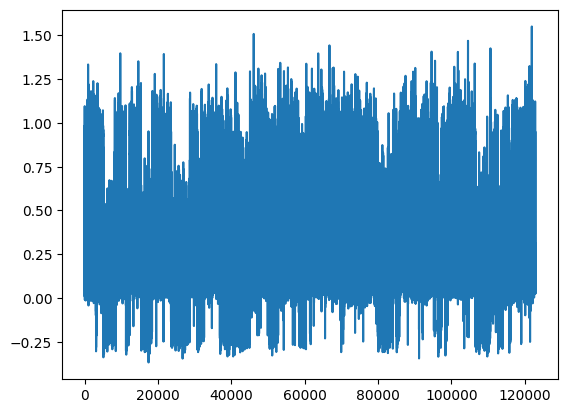

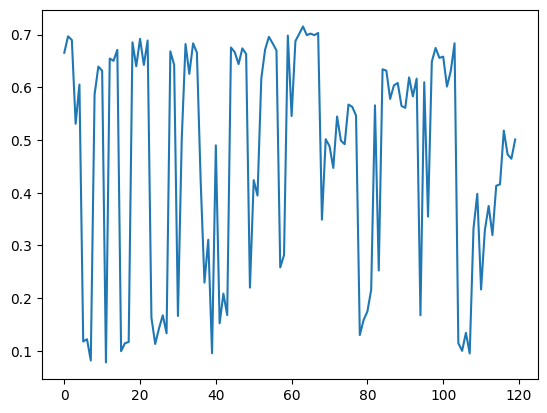

[PPO] Epoch 0: Loss=62.2093, Policy=0.0042, Value=124.4668
[PPO] Epoch 10: Loss=30.0599, Policy=-0.0123, Value=60.1972
[PPO] Epoch 20: Loss=24.9507, Policy=-0.0222, Value=50.0003
[PPO] Epoch 30: Loss=20.7487, Policy=-0.0387, Value=41.6289
Approx KL Learned: 0.03240975737571716
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 31/100 — steps: 4096


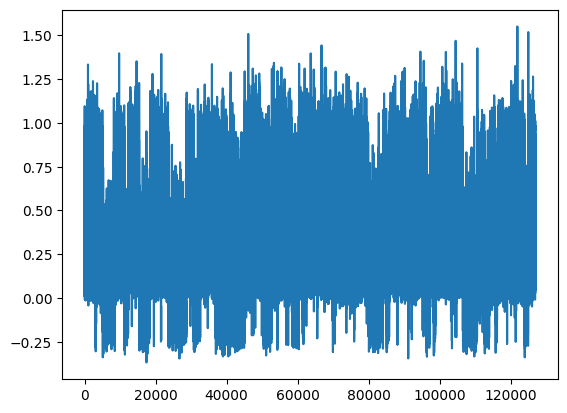

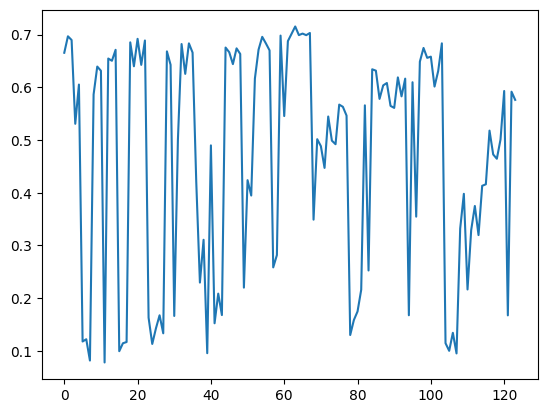

[PPO] Epoch 0: Loss=51.3323, Policy=0.0064, Value=102.6977
[PPO] Epoch 10: Loss=25.6825, Policy=-0.0049, Value=51.4181
[PPO] Epoch 20: Loss=20.1477, Policy=-0.0197, Value=40.3767
[PPO] Epoch 30: Loss=15.6351, Policy=-0.0293, Value=31.3730
Approx KL Learned: 0.04558783024549484
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 32/100 — steps: 4096


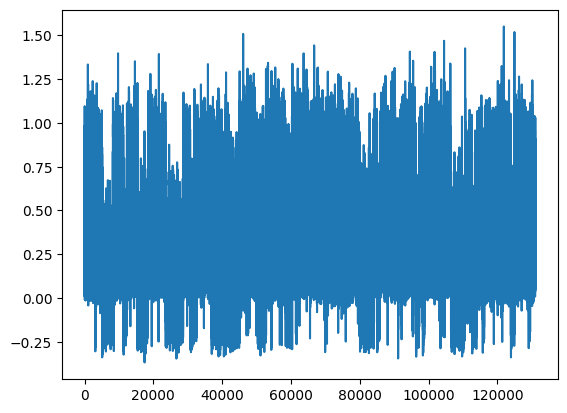

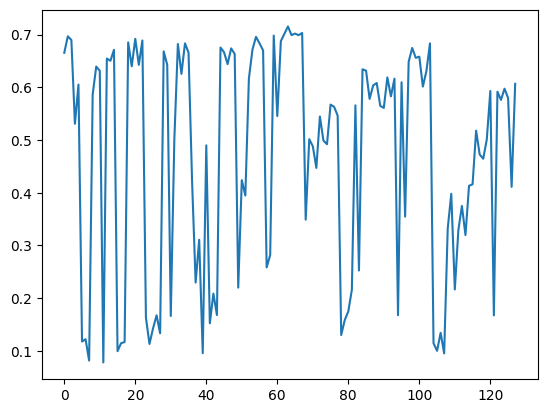

[PPO] Epoch 0: Loss=43.3297, Policy=0.0053, Value=86.6850
[PPO] Epoch 10: Loss=22.6992, Policy=-0.0064, Value=45.4444
[PPO] Epoch 20: Loss=19.3225, Policy=-0.0154, Value=38.7077
[PPO] Epoch 30: Loss=13.2364, Policy=-0.0217, Value=26.5458
Approx KL Learned: 0.04310035705566406
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 33/100 — steps: 4096


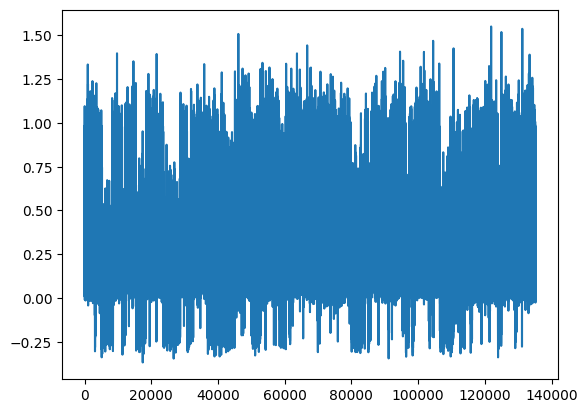

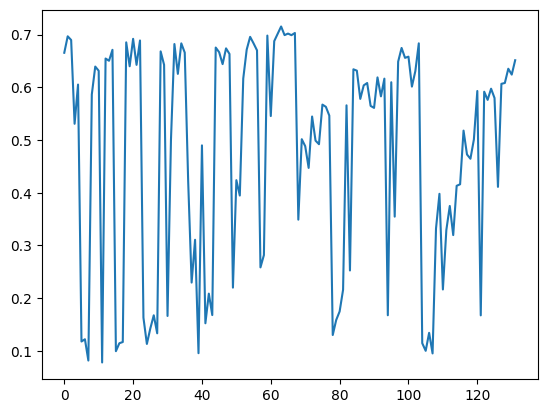

[PPO] Epoch 0: Loss=26.8470, Policy=0.0036, Value=53.7189
[PPO] Epoch 10: Loss=13.7430, Policy=-0.0041, Value=27.5224
[PPO] Epoch 20: Loss=10.9108, Policy=-0.0146, Value=21.8778
[PPO] Epoch 30: Loss=10.0928, Policy=-0.0184, Value=20.2504
Approx KL Learned: 0.042373161762952805
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 34/100 — steps: 4096


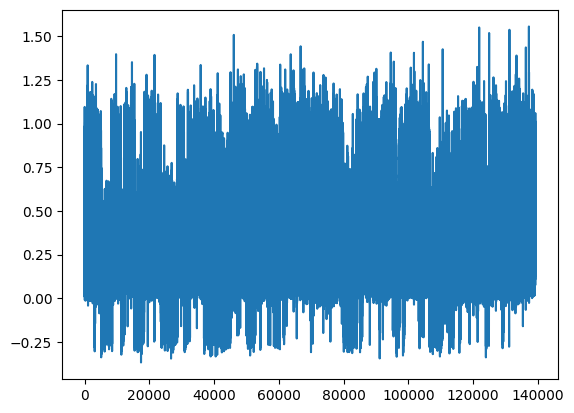

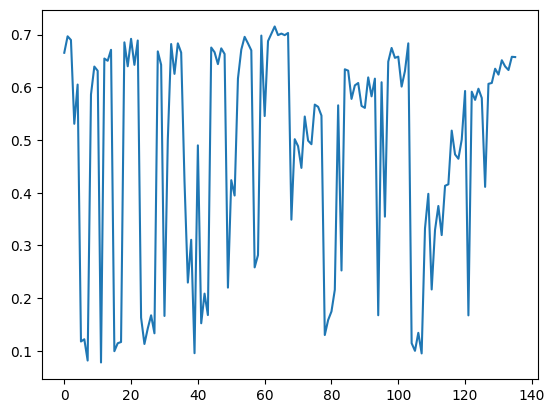

[PPO] Epoch 0: Loss=52.3757, Policy=0.0064, Value=104.7740
[PPO] Epoch 10: Loss=27.5734, Policy=-0.0046, Value=55.1898
[PPO] Epoch 20: Loss=18.1553, Policy=-0.0142, Value=36.3712
[PPO] Epoch 30: Loss=12.6107, Policy=-0.0241, Value=25.3043
Approx KL Learned: 0.030250538140535355
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 35/100 — steps: 4096


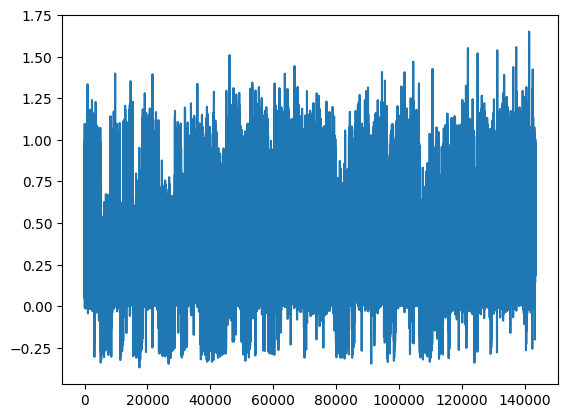

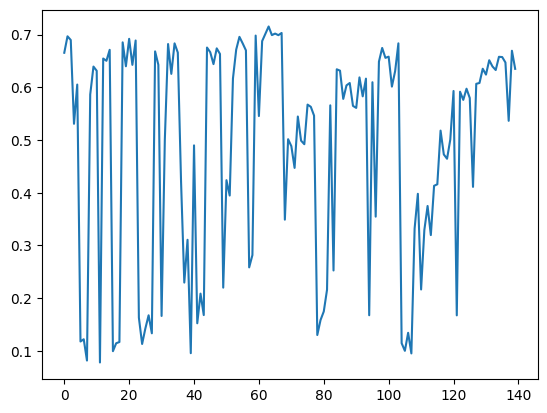

[PPO] Epoch 0: Loss=62.5262, Policy=0.0063, Value=125.0938
[PPO] Epoch 10: Loss=33.8416, Policy=-0.0057, Value=67.7466
[PPO] Epoch 20: Loss=20.8331, Policy=-0.0216, Value=41.7606
[PPO] Epoch 30: Loss=16.3998, Policy=-0.0362, Value=32.9234
Approx KL Learned: 0.052946899086236954
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 36/100 — steps: 4096


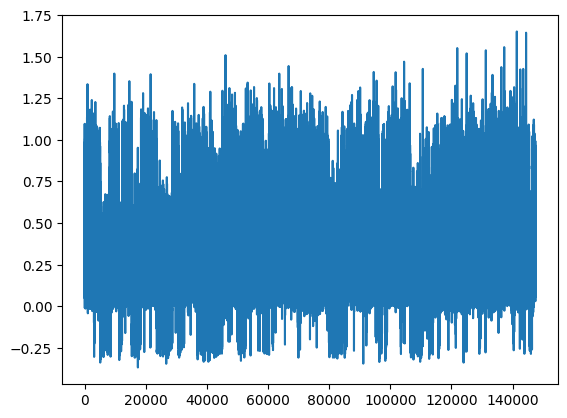

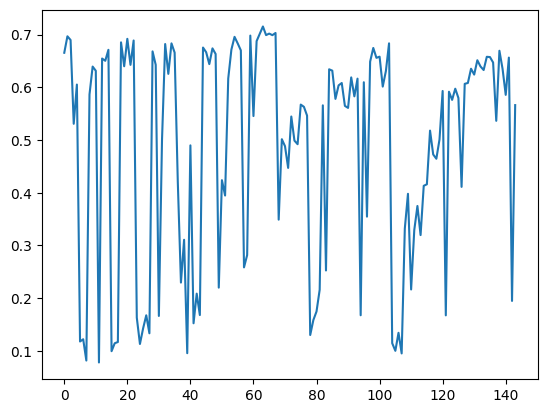

[PPO] Epoch 0: Loss=48.6427, Policy=0.0078, Value=97.3038
[PPO] Epoch 10: Loss=36.1236, Policy=-0.0133, Value=72.3042
[PPO] Epoch 20: Loss=30.9106, Policy=-0.0290, Value=61.9097
[PPO] Epoch 30: Loss=26.6295, Policy=-0.0403, Value=53.3705
Approx KL Learned: 0.04836726188659668
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 37/100 — steps: 4096


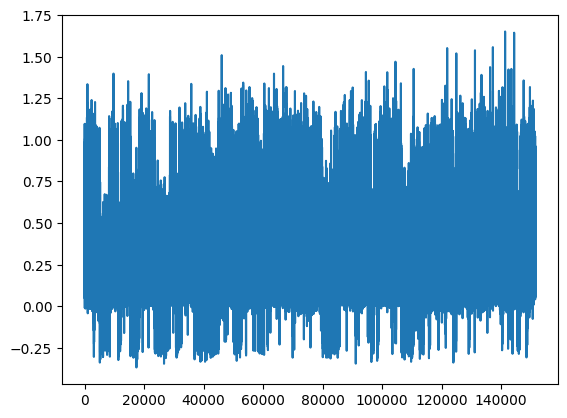

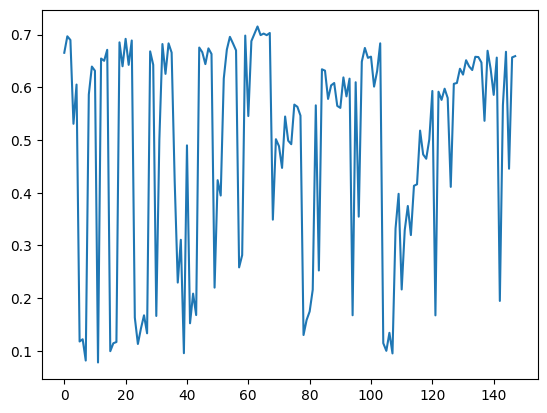

[PPO] Epoch 0: Loss=99.3549, Policy=0.0073, Value=198.7585
[PPO] Epoch 10: Loss=36.8988, Policy=0.0006, Value=73.8593
[PPO] Epoch 20: Loss=29.7577, Policy=-0.0081, Value=59.5960
[PPO] Epoch 30: Loss=25.2763, Policy=-0.0332, Value=50.6793
Approx KL Learned: 0.06123480945825577
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 38/100 — steps: 4096


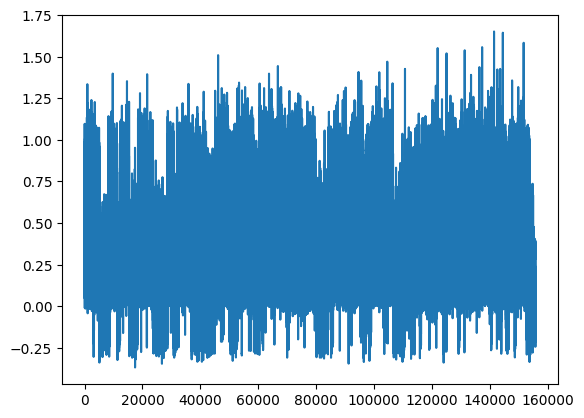

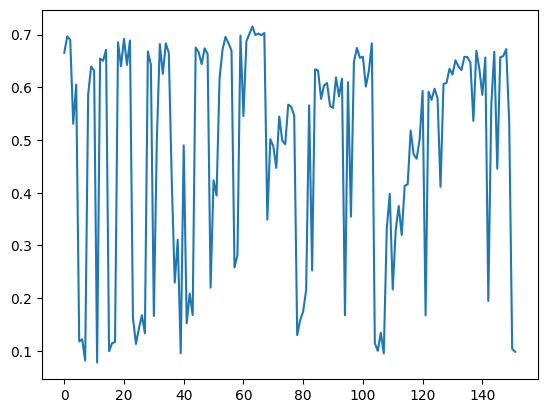

[PPO] Epoch 0: Loss=67.2867, Policy=0.0127, Value=134.6048
[PPO] Epoch 10: Loss=27.2738, Policy=-0.0057, Value=54.6158
[PPO] Epoch 20: Loss=16.2813, Policy=-0.0283, Value=32.6761
[PPO] Epoch 30: Loss=12.1393, Policy=-0.0452, Value=24.4243
Approx KL Learned: 0.08912883698940277
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 39/100 — steps: 4096


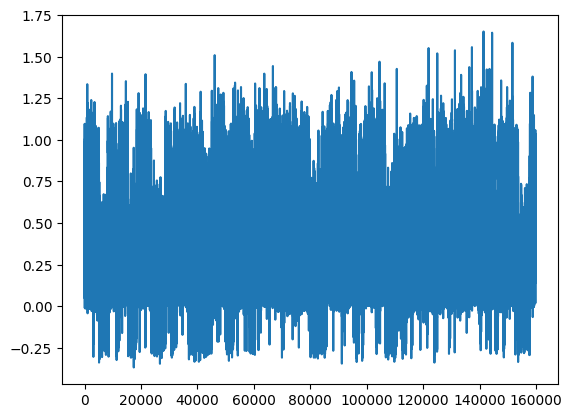

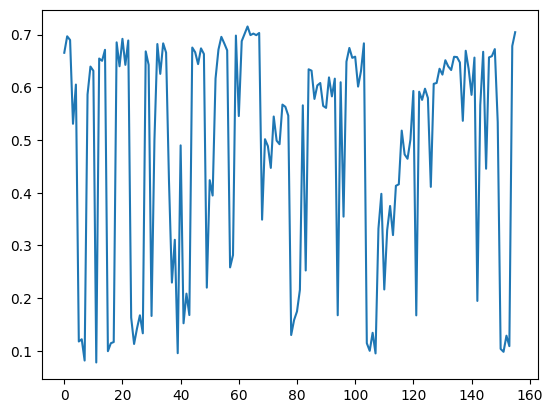

[PPO] Epoch 0: Loss=87.0524, Policy=0.0065, Value=174.1143
[PPO] Epoch 10: Loss=31.1409, Policy=0.0620, Value=62.1745
[PPO] Epoch 20: Loss=21.4027, Policy=0.0097, Value=42.8070
[PPO] Epoch 30: Loss=16.7514, Policy=-0.0128, Value=33.5535
Approx KL Learned: 0.046878717839717865
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 40/100 — steps: 4096


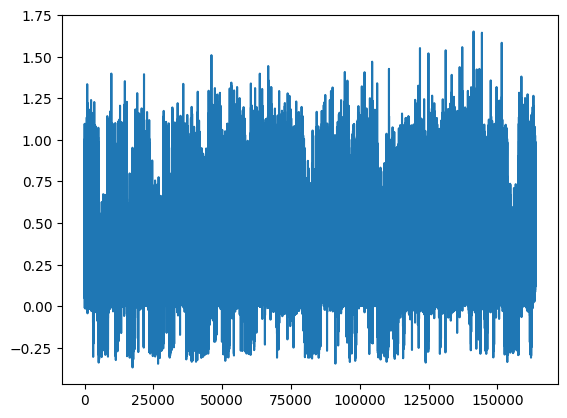

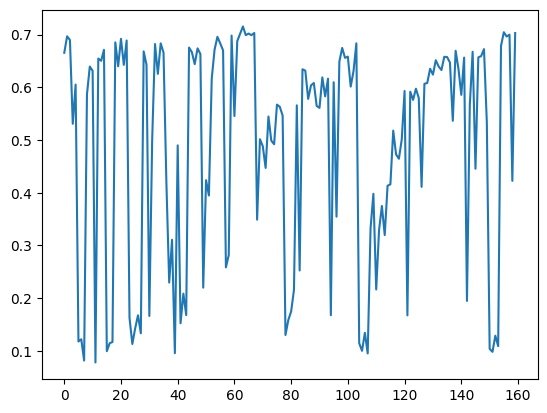

[PPO] Epoch 0: Loss=83.3856, Policy=0.0079, Value=166.7749
[PPO] Epoch 10: Loss=26.7271, Policy=-0.0034, Value=53.4816
[PPO] Epoch 20: Loss=18.3224, Policy=-0.0132, Value=36.6910
[PPO] Epoch 30: Loss=13.5086, Policy=-0.0205, Value=27.0793
Approx KL Learned: 0.03280686214566231
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 41/100 — steps: 4096


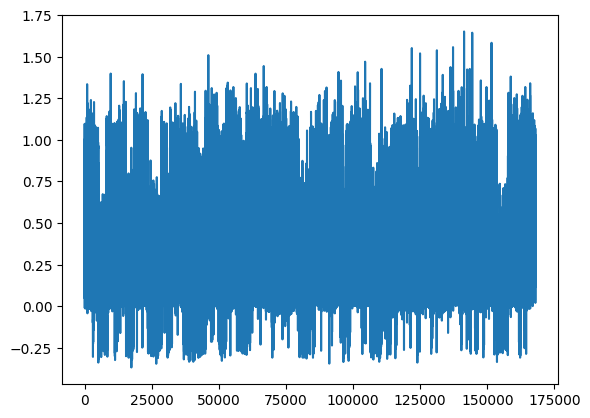

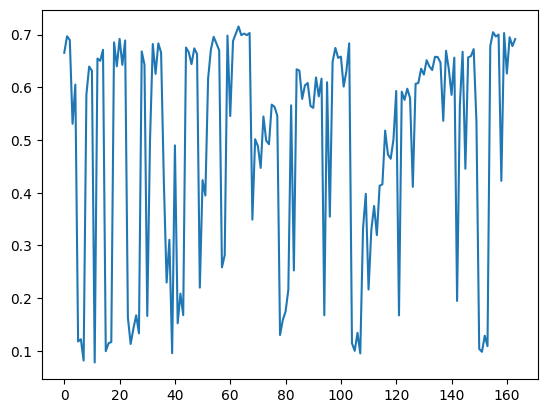

[PPO] Epoch 0: Loss=51.2963, Policy=0.0003, Value=102.6226
[PPO] Epoch 10: Loss=26.6372, Policy=-0.0042, Value=53.3130
[PPO] Epoch 20: Loss=17.3578, Policy=-0.0192, Value=34.7838
[PPO] Epoch 30: Loss=14.7350, Policy=-0.0309, Value=29.5618
Approx KL Learned: 0.03265354782342911
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 42/100 — steps: 4096


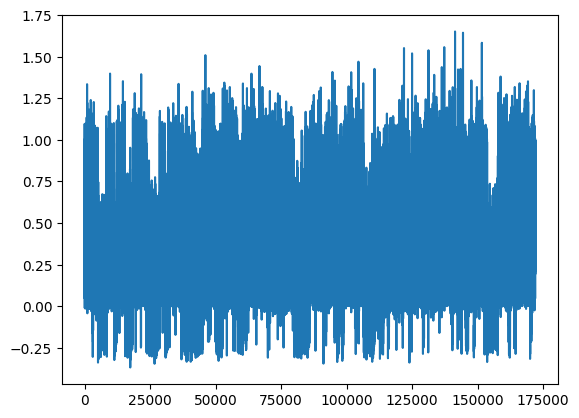

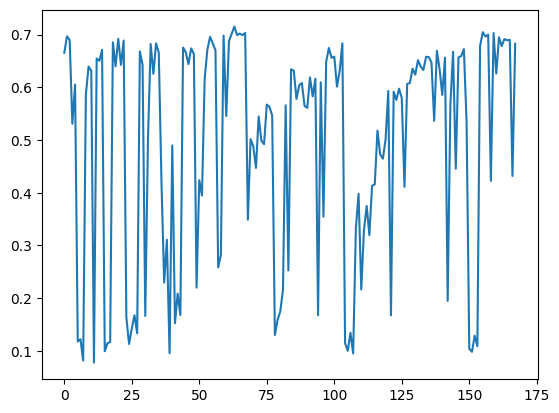

[PPO] Epoch 0: Loss=47.4992, Policy=0.0083, Value=95.0066
[PPO] Epoch 10: Loss=17.7875, Policy=0.0019, Value=35.5965
[PPO] Epoch 20: Loss=11.9353, Policy=-0.0100, Value=23.9143
[PPO] Epoch 30: Loss=9.1260, Policy=-0.0198, Value=18.3159
Approx KL Learned: 0.02141803689301014
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 43/100 — steps: 4096


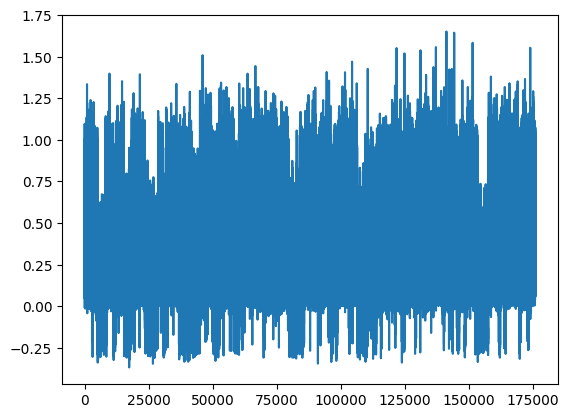

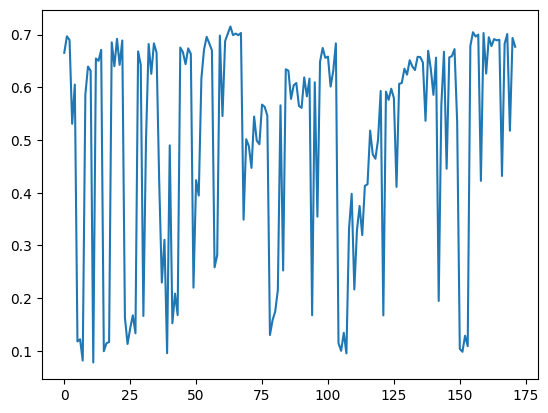

[PPO] Epoch 0: Loss=73.1178, Policy=0.0055, Value=146.2842
[PPO] Epoch 10: Loss=47.9434, Policy=0.0023, Value=95.9417
[PPO] Epoch 20: Loss=34.9464, Policy=-0.0163, Value=69.9838
[PPO] Epoch 30: Loss=26.7802, Policy=-0.0301, Value=53.6782
Approx KL Learned: 0.051603592932224274
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 44/100 — steps: 4096


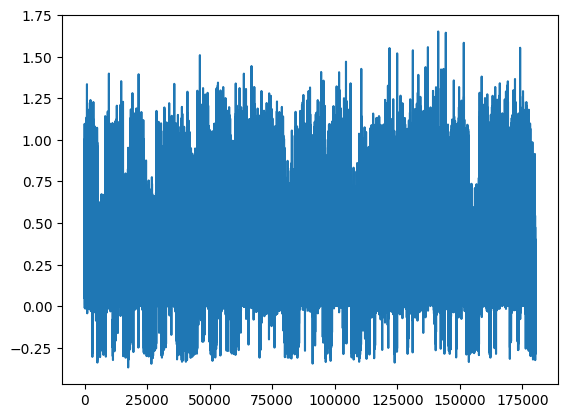

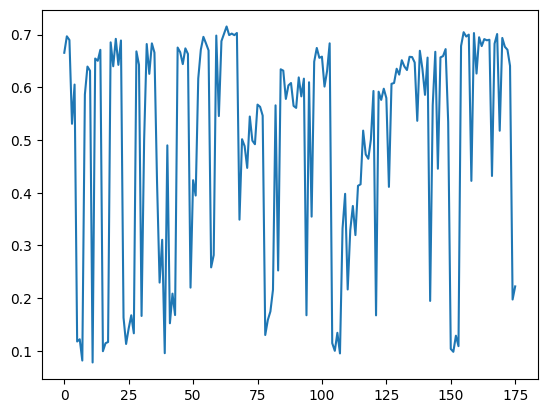

[PPO] Epoch 0: Loss=52.3341, Policy=0.0090, Value=104.6707
[PPO] Epoch 10: Loss=25.8986, Policy=-0.0001, Value=51.8162
[PPO] Epoch 20: Loss=20.8077, Policy=-0.0088, Value=41.6528
[PPO] Epoch 30: Loss=18.7856, Policy=-0.0208, Value=37.6348
Approx KL Learned: 0.03497002273797989
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 45/100 — steps: 4096


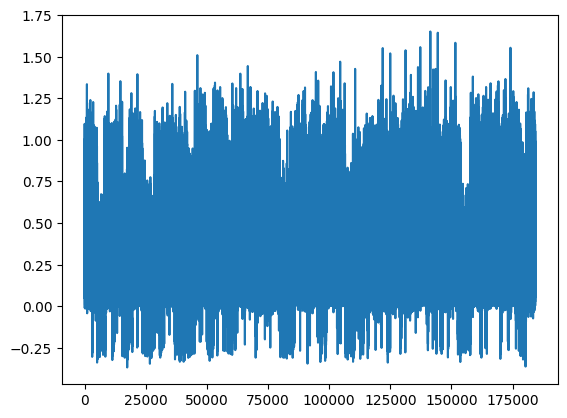

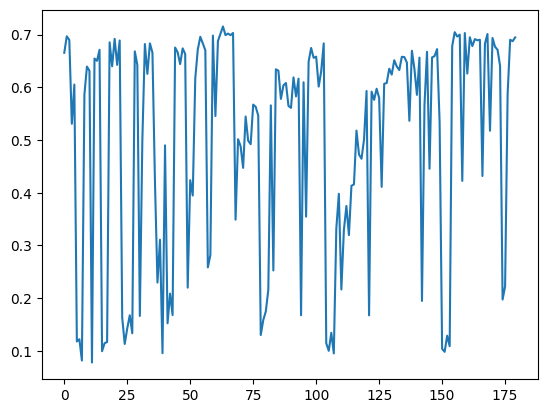

[PPO] Epoch 0: Loss=31.6513, Policy=0.0071, Value=63.3265
[PPO] Epoch 10: Loss=25.7886, Policy=-0.0182, Value=51.6489
[PPO] Epoch 20: Loss=20.3414, Policy=-0.0361, Value=40.7906
[PPO] Epoch 30: Loss=16.6204, Policy=-0.0496, Value=33.3778
Approx KL Learned: 0.0862230584025383
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 46/100 — steps: 4096


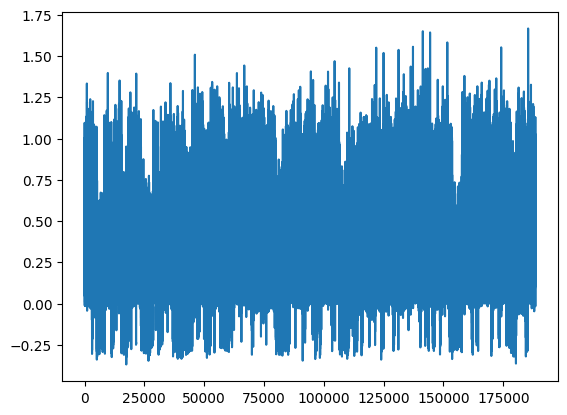

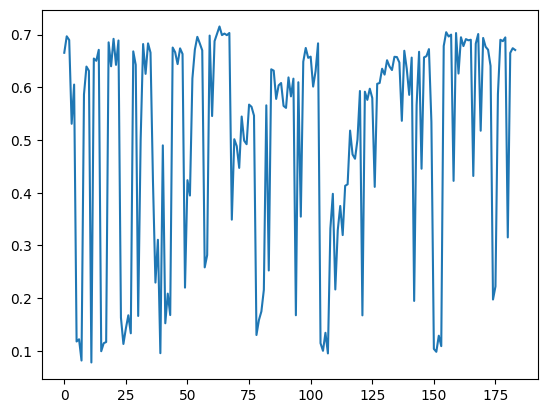

[PPO] Epoch 0: Loss=47.4489, Policy=0.0119, Value=94.9050
[PPO] Epoch 10: Loss=23.4277, Policy=-0.0026, Value=46.8838
[PPO] Epoch 20: Loss=17.0608, Policy=-0.0174, Value=34.1854
[PPO] Epoch 30: Loss=14.5326, Policy=-0.0273, Value=29.1519
Approx KL Learned: 0.07087322324514389
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 47/100 — steps: 4096


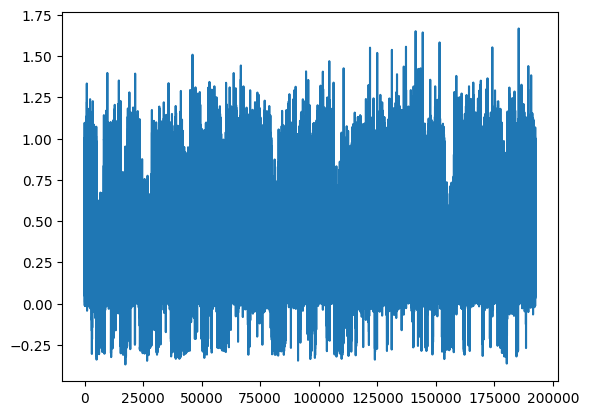

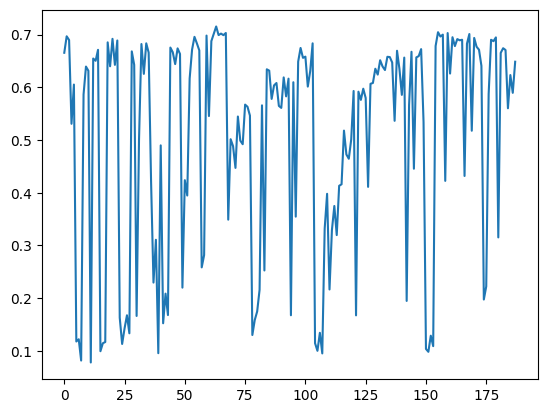

[PPO] Epoch 0: Loss=81.4780, Policy=0.0131, Value=162.9811
[PPO] Epoch 10: Loss=46.5225, Policy=0.0026, Value=93.0896
[PPO] Epoch 20: Loss=31.5854, Policy=-0.0147, Value=63.2488
[PPO] Epoch 30: Loss=22.5500, Policy=-0.0293, Value=45.2069
Approx KL Learned: 0.057292915880680084
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 48/100 — steps: 4096


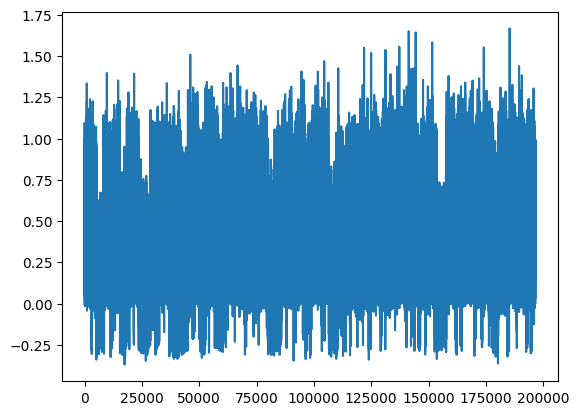

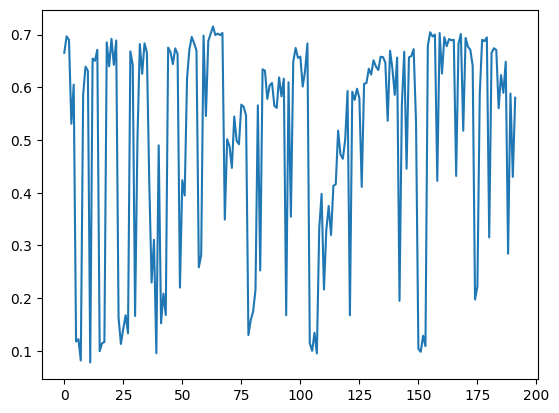

[PPO] Epoch 0: Loss=38.9987, Policy=0.0108, Value=78.0119
[PPO] Epoch 10: Loss=21.7659, Policy=-0.0091, Value=43.5825
[PPO] Epoch 20: Loss=18.0946, Policy=-0.0260, Value=36.2781
[PPO] Epoch 30: Loss=14.9675, Policy=-0.0335, Value=30.0451
Approx KL Learned: 0.09553001821041107
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 49/100 — steps: 4096


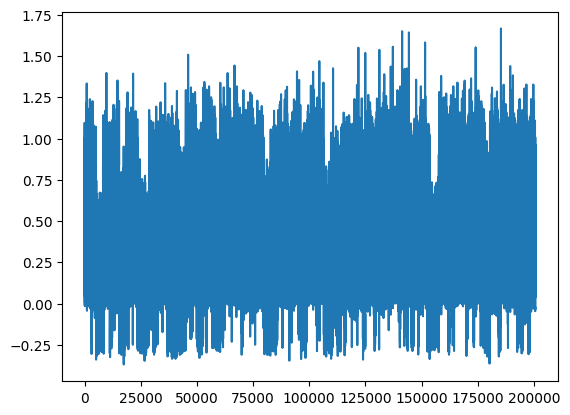

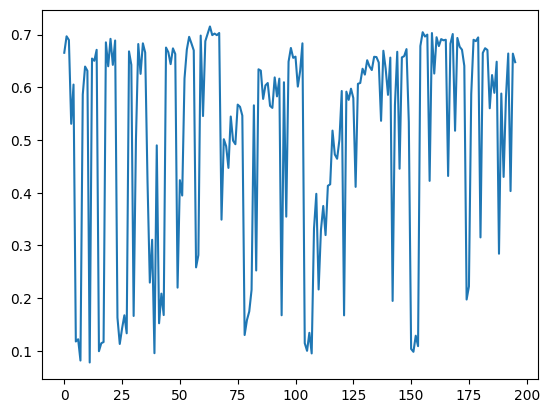

[PPO] Epoch 0: Loss=37.5519, Policy=0.0133, Value=75.1137
[PPO] Epoch 10: Loss=20.1318, Policy=0.0006, Value=40.2917
[PPO] Epoch 20: Loss=15.5048, Policy=-0.0038, Value=31.0475
[PPO] Epoch 30: Loss=11.5934, Policy=-0.0107, Value=23.2407
Approx KL Learned: 0.054485440254211426
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 50/100 — steps: 4096


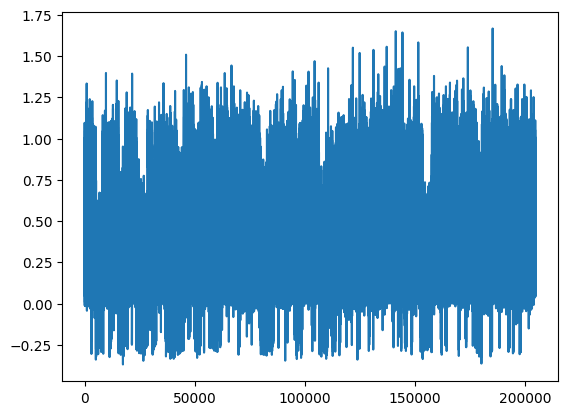

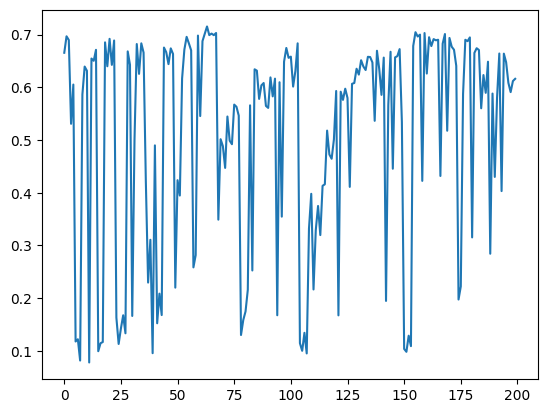

[PPO] Epoch 0: Loss=47.6395, Policy=0.0091, Value=95.2973
[PPO] Epoch 10: Loss=30.1734, Policy=-0.0023, Value=60.3843
[PPO] Epoch 20: Loss=19.2786, Policy=-0.0136, Value=38.6190
[PPO] Epoch 30: Loss=15.0284, Policy=-0.0206, Value=30.1363
Approx KL Learned: 0.05850735306739807
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 51/100 — steps: 4096


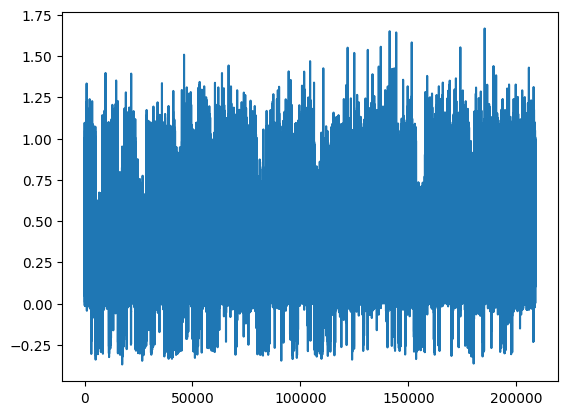

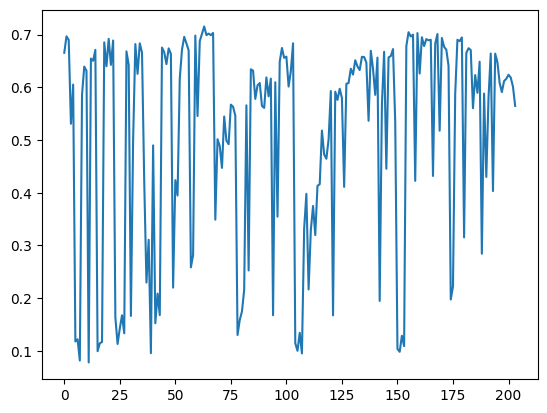

[PPO] Epoch 0: Loss=64.8883, Policy=0.0096, Value=129.8272
[PPO] Epoch 10: Loss=33.9657, Policy=-0.0071, Value=68.0079
[PPO] Epoch 20: Loss=22.9208, Policy=-0.0233, Value=45.9543
[PPO] Epoch 30: Loss=17.7162, Policy=-0.0417, Value=35.5800
Approx KL Learned: 0.04476535692811012
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 52/100 — steps: 4096


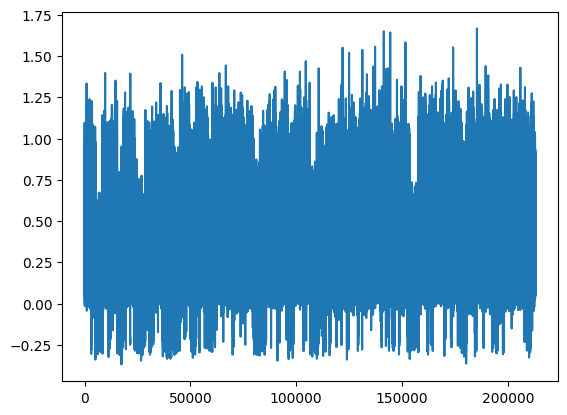

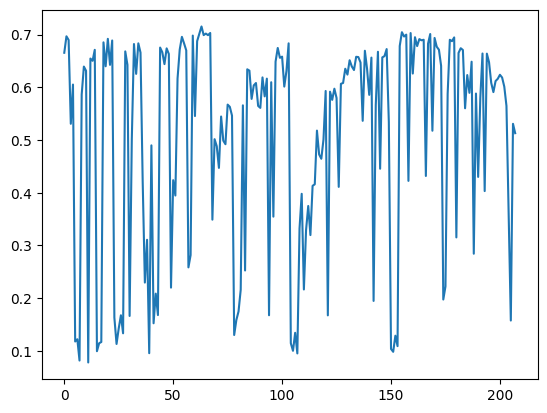

[PPO] Epoch 0: Loss=49.3937, Policy=0.0091, Value=98.8167
[PPO] Epoch 10: Loss=34.6905, Policy=-0.0060, Value=69.4375
[PPO] Epoch 20: Loss=26.8471, Policy=-0.0185, Value=53.7749
[PPO] Epoch 30: Loss=22.1952, Policy=-0.0262, Value=44.4922
Approx KL Learned: 0.046761855483055115
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 53/100 — steps: 4096


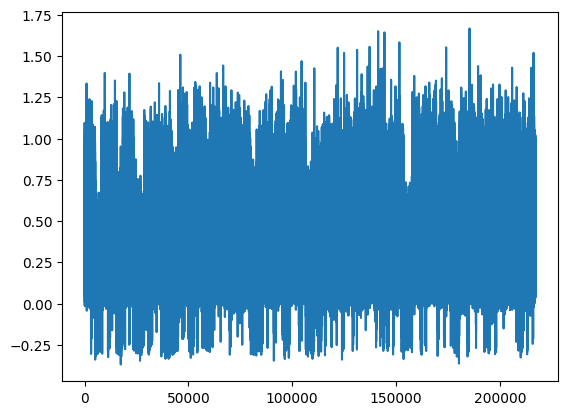

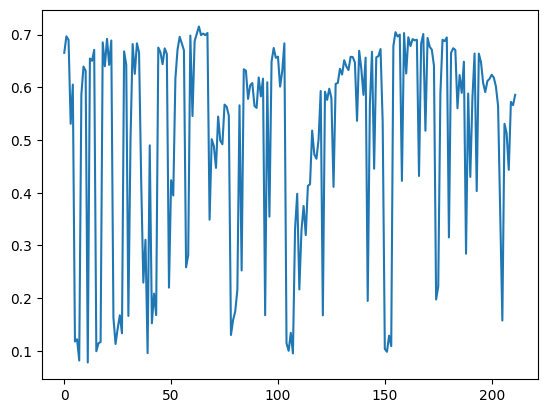

[PPO] Epoch 0: Loss=39.3618, Policy=0.0125, Value=78.7439
[PPO] Epoch 10: Loss=22.7068, Policy=-0.0053, Value=45.4645
[PPO] Epoch 20: Loss=16.7197, Policy=-0.0152, Value=33.5103
[PPO] Epoch 30: Loss=14.8097, Policy=-0.0241, Value=29.7101
Approx KL Learned: 0.04149860143661499
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 54/100 — steps: 4096


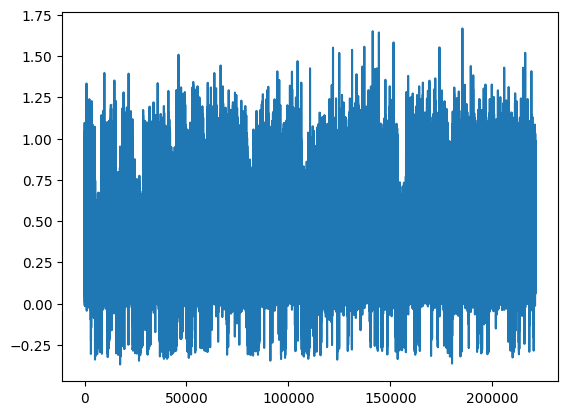

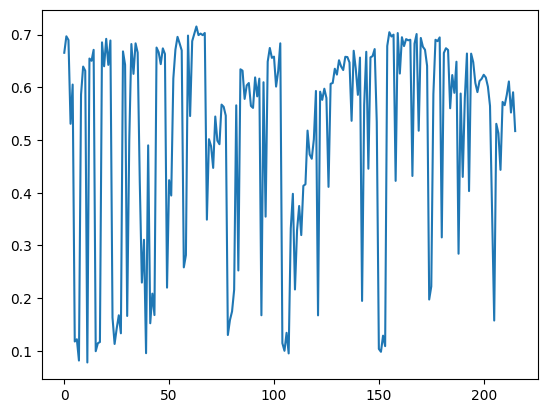

[PPO] Epoch 0: Loss=32.7254, Policy=0.0059, Value=65.4767
[PPO] Epoch 10: Loss=18.7730, Policy=-0.0066, Value=37.5923
[PPO] Epoch 20: Loss=17.2850, Policy=-0.0160, Value=34.6339
[PPO] Epoch 30: Loss=13.3011, Policy=-0.0186, Value=26.6699
Approx KL Learned: 0.03147503733634949
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 55/100 — steps: 4096


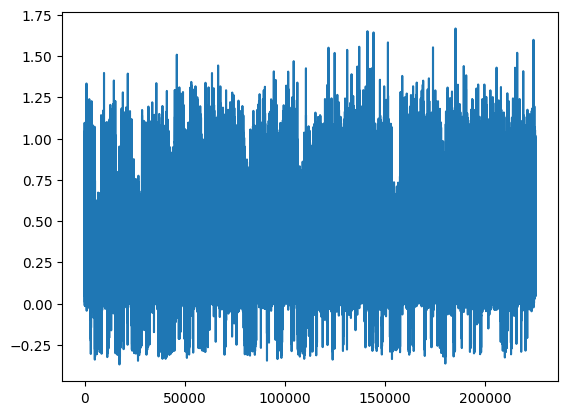

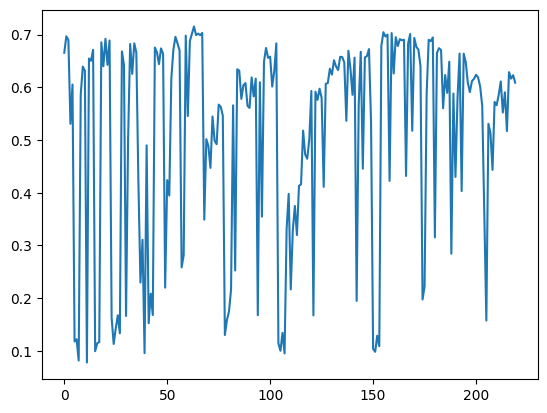

[PPO] Epoch 0: Loss=48.8001, Policy=0.0084, Value=97.6193
[PPO] Epoch 10: Loss=32.1292, Policy=-0.0083, Value=64.3044
[PPO] Epoch 20: Loss=22.9723, Policy=-0.0118, Value=46.0018
[PPO] Epoch 30: Loss=15.3339, Policy=-0.0184, Value=30.7380
Approx KL Learned: 0.044869549572467804
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 56/100 — steps: 4096


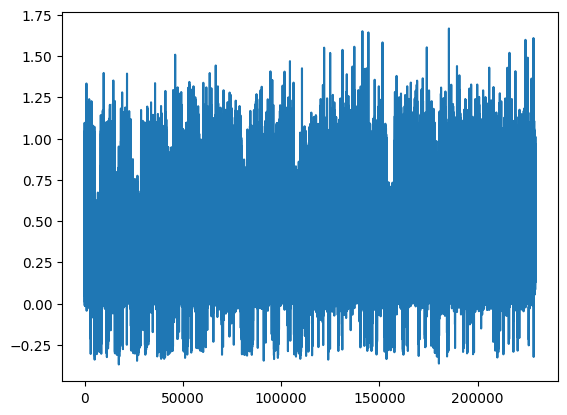

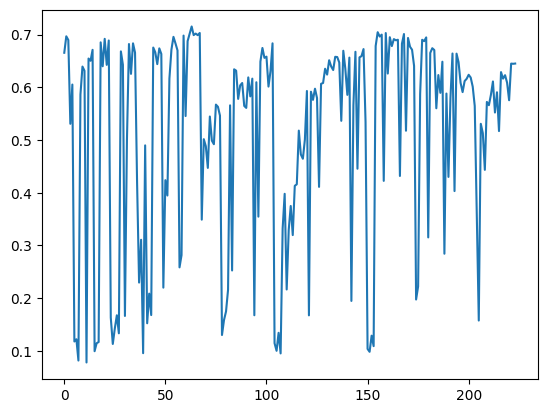

[PPO] Epoch 0: Loss=121.6214, Policy=0.0086, Value=243.2950
[PPO] Epoch 10: Loss=49.7353, Policy=0.0089, Value=99.5226
[PPO] Epoch 20: Loss=40.5242, Policy=-0.0069, Value=81.1299
[PPO] Epoch 30: Loss=35.5591, Policy=-0.0214, Value=71.2288
Approx KL Learned: 0.04459841549396515
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 57/100 — steps: 4096


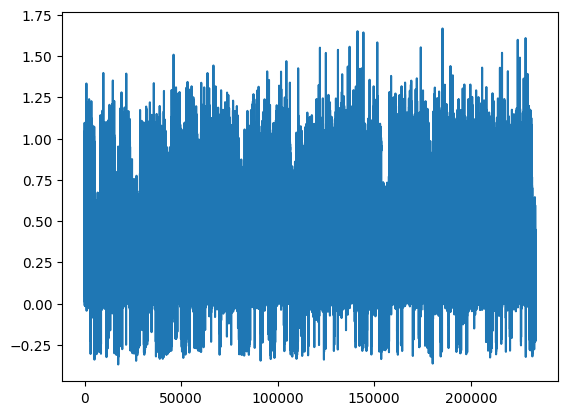

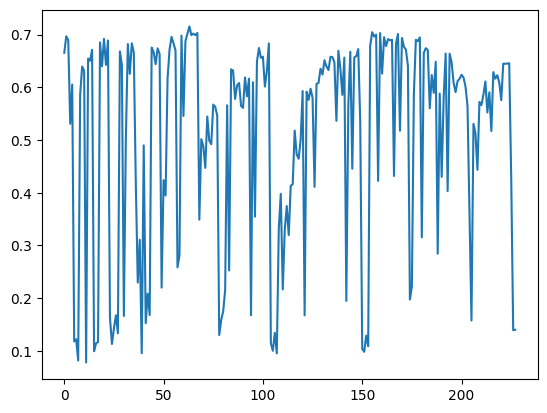

[PPO] Epoch 0: Loss=56.8022, Policy=0.0089, Value=113.6100
[PPO] Epoch 10: Loss=24.3745, Policy=0.0049, Value=48.7557
[PPO] Epoch 20: Loss=14.3657, Policy=-0.0067, Value=28.7650
[PPO] Epoch 30: Loss=9.8535, Policy=-0.0056, Value=19.7540
Approx KL Learned: 0.17515826225280762
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 58/100 — steps: 4096


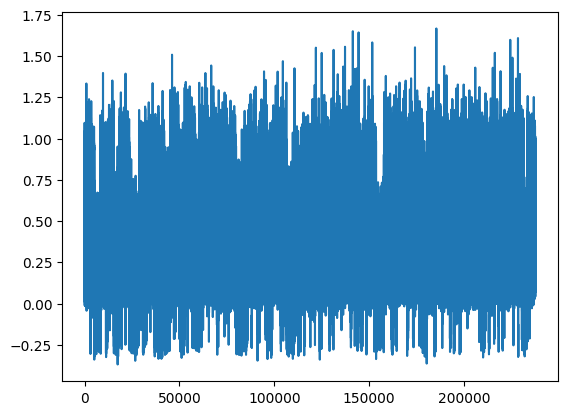

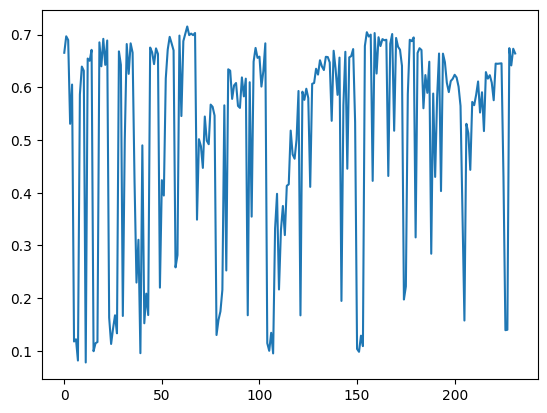

[PPO] Epoch 0: Loss=78.6053, Policy=0.0115, Value=157.2410
[PPO] Epoch 10: Loss=49.9942, Policy=0.0014, Value=100.0423
[PPO] Epoch 20: Loss=34.0433, Policy=-0.0119, Value=68.1673
[PPO] Epoch 30: Loss=30.5512, Policy=-0.0214, Value=61.2038
Approx KL Learned: 0.06713342666625977
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 59/100 — steps: 4096


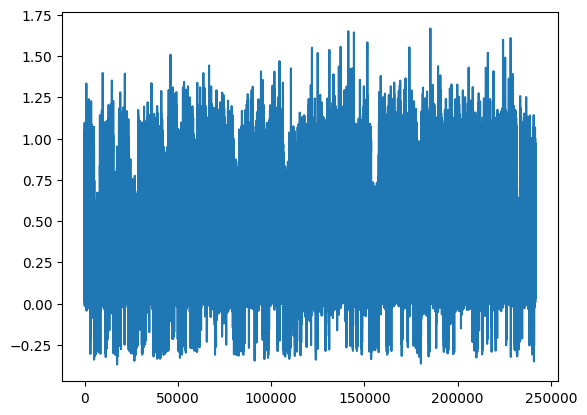

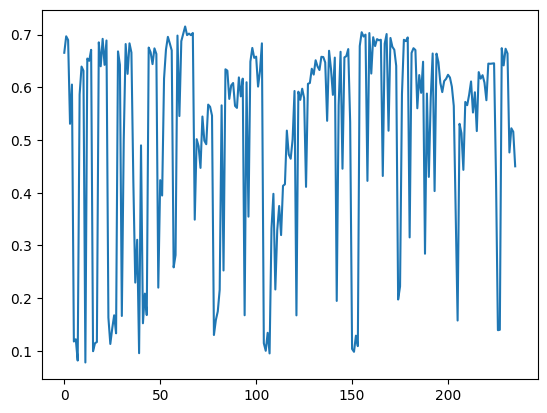

[PPO] Epoch 0: Loss=56.6726, Policy=0.0091, Value=113.3775
[PPO] Epoch 10: Loss=30.7332, Policy=-0.0001, Value=61.5154
[PPO] Epoch 20: Loss=23.7922, Policy=-0.0197, Value=47.6730
[PPO] Epoch 30: Loss=19.3145, Policy=-0.0320, Value=38.7439
Approx KL Learned: 0.062072303146123886
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 60/100 — steps: 4096


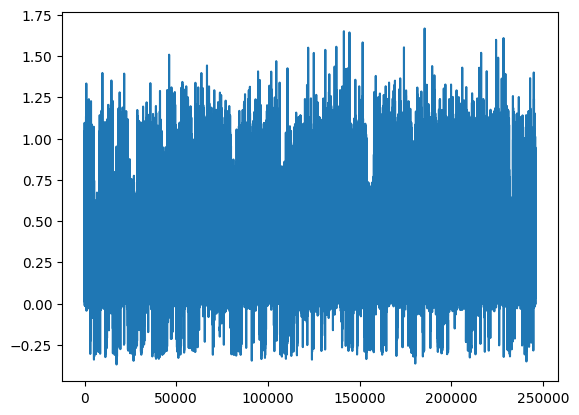

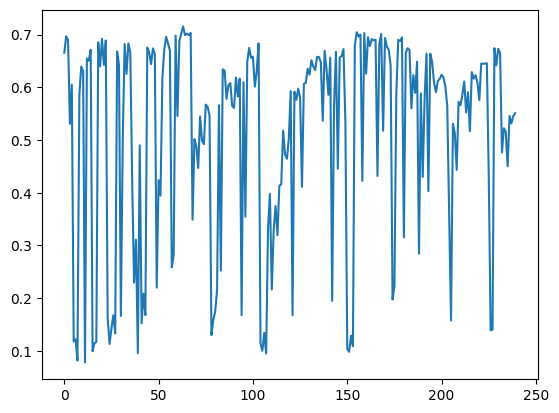

[PPO] Epoch 0: Loss=38.3209, Policy=0.0064, Value=76.6821
[PPO] Epoch 10: Loss=21.0132, Policy=-0.0101, Value=42.0929
[PPO] Epoch 20: Loss=14.9470, Policy=-0.0232, Value=29.9881
[PPO] Epoch 30: Loss=12.1954, Policy=-0.0360, Value=24.5158
Approx KL Learned: 0.09895556420087814
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 61/100 — steps: 4096


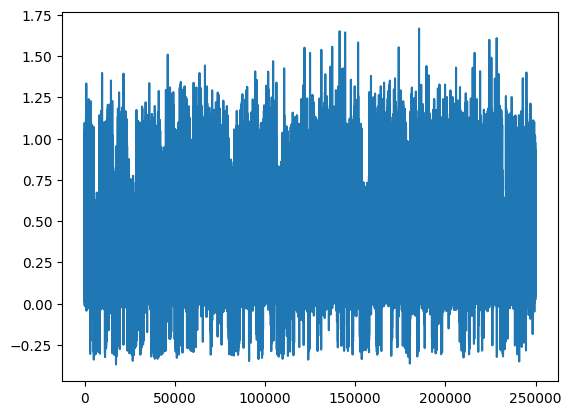

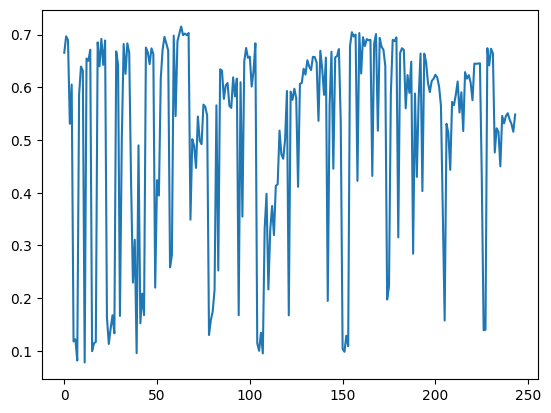

[PPO] Epoch 0: Loss=89.9590, Policy=0.0085, Value=179.9724
[PPO] Epoch 10: Loss=41.1250, Policy=-0.0097, Value=82.3340
[PPO] Epoch 20: Loss=25.0718, Policy=-0.0290, Value=50.2661
[PPO] Epoch 30: Loss=16.4747, Policy=-0.0485, Value=33.1145
Approx KL Learned: 0.06209470331668854
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 62/100 — steps: 4096


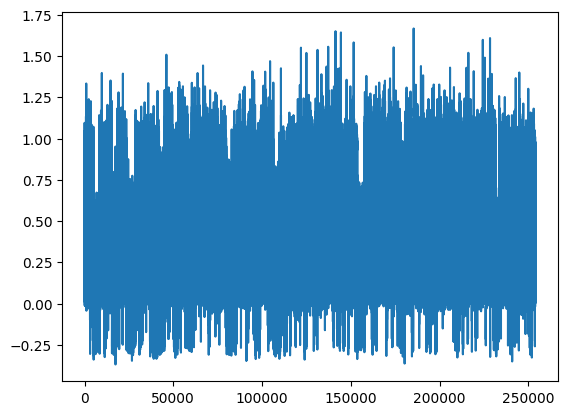

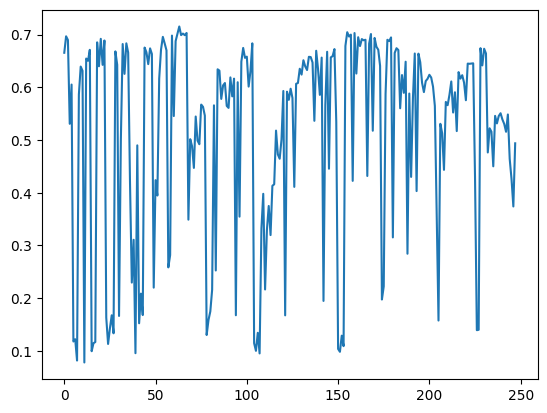

[PPO] Epoch 0: Loss=101.9121, Policy=0.0139, Value=203.8785
[PPO] Epoch 10: Loss=54.9628, Policy=0.0015, Value=110.0034
[PPO] Epoch 20: Loss=32.8423, Policy=-0.0118, Value=65.7873
[PPO] Epoch 30: Loss=22.2954, Policy=-0.0311, Value=44.7328
Approx KL Learned: 0.045467715710401535
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 63/100 — steps: 4096


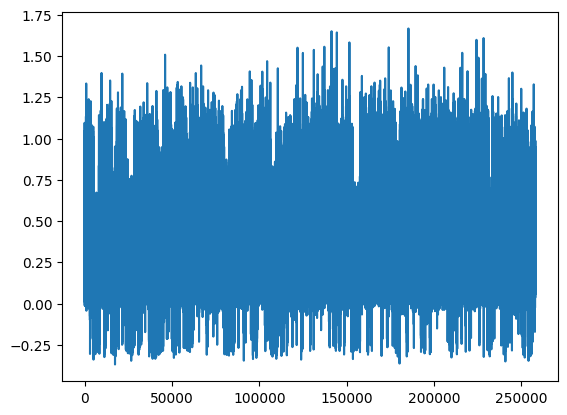

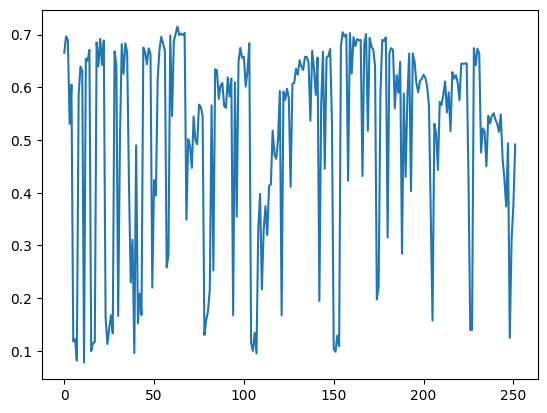

[PPO] Epoch 0: Loss=107.5346, Policy=0.0129, Value=215.1124
[PPO] Epoch 10: Loss=56.4984, Policy=-0.0018, Value=113.0653
[PPO] Epoch 20: Loss=38.2653, Policy=-0.0070, Value=76.6100
[PPO] Epoch 30: Loss=27.5415, Policy=-0.0164, Value=55.1819
Approx KL Learned: 0.03877747058868408
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 64/100 — steps: 4096


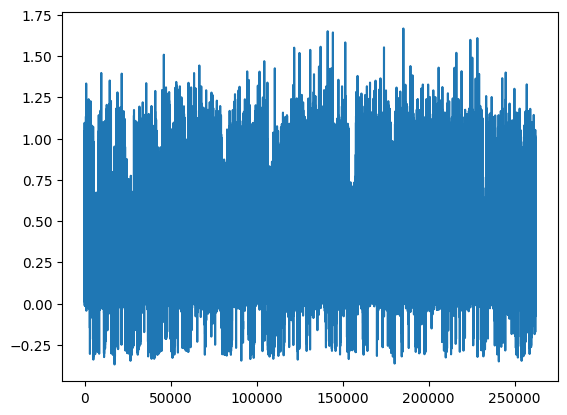

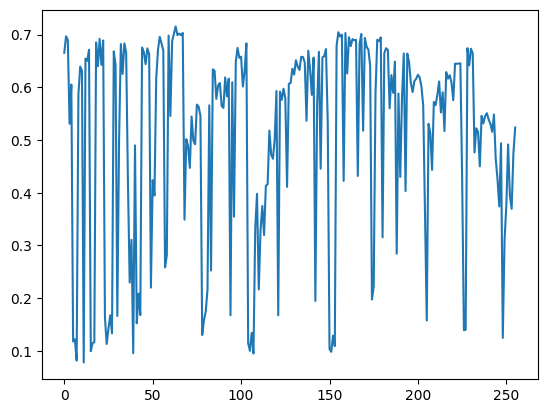

[PPO] Epoch 0: Loss=95.8191, Policy=0.0165, Value=191.6866
[PPO] Epoch 10: Loss=49.3910, Policy=0.0019, Value=98.8571
[PPO] Epoch 20: Loss=29.0395, Policy=-0.0189, Value=58.1956
[PPO] Epoch 30: Loss=18.5753, Policy=-0.0350, Value=37.2997
Approx KL Learned: 0.05307576805353165
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 65/100 — steps: 4096


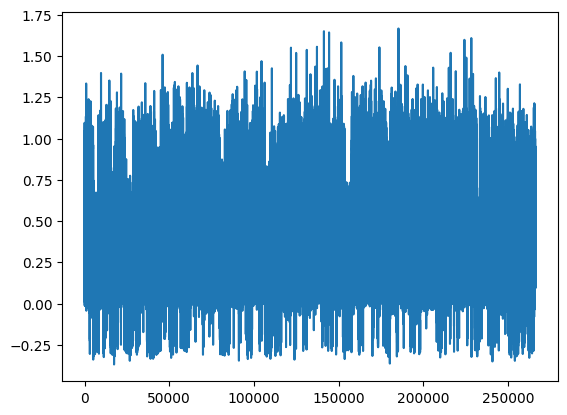

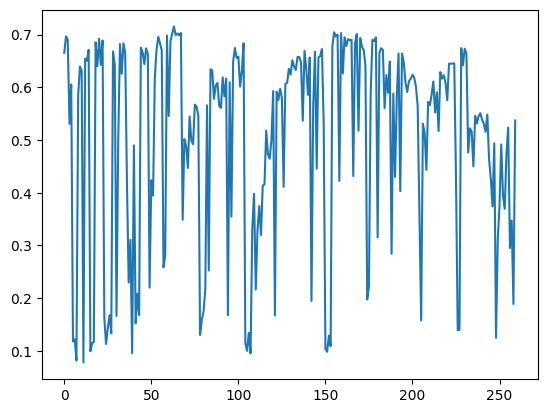

[PPO] Epoch 0: Loss=70.7127, Policy=0.0071, Value=141.4790
[PPO] Epoch 10: Loss=36.3278, Policy=-0.0084, Value=72.7361
[PPO] Epoch 20: Loss=19.0221, Policy=-0.0233, Value=38.1559
[PPO] Epoch 30: Loss=11.7475, Policy=-0.0430, Value=23.6460
Approx KL Learned: 0.04352458938956261
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 66/100 — steps: 4096


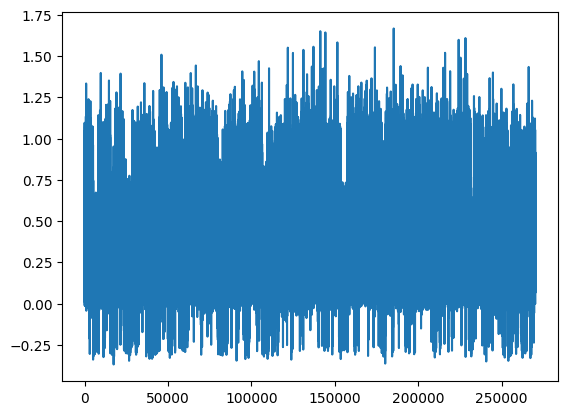

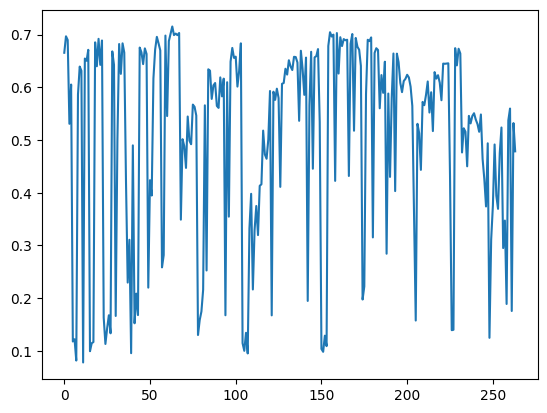

[PPO] Epoch 0: Loss=60.0315, Policy=0.0104, Value=120.0977
[PPO] Epoch 10: Loss=32.6228, Policy=-0.0005, Value=65.2970
[PPO] Epoch 20: Loss=22.1973, Policy=-0.0113, Value=44.4703
[PPO] Epoch 30: Loss=17.1286, Policy=-0.0243, Value=34.3610
Approx KL Learned: 0.04259897768497467
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 67/100 — steps: 4096


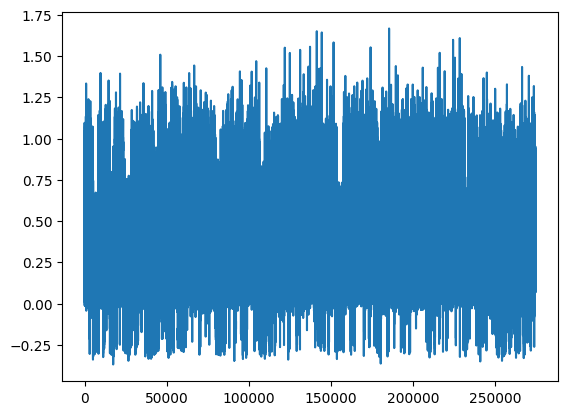

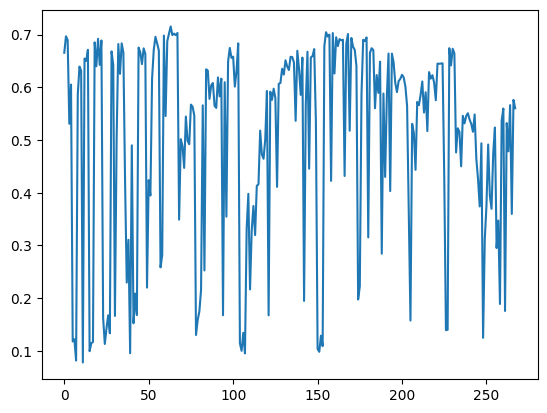

[PPO] Epoch 0: Loss=53.3885, Policy=0.0075, Value=106.8094
[PPO] Epoch 10: Loss=32.5453, Policy=-0.0007, Value=65.1375
[PPO] Epoch 20: Loss=20.8420, Policy=-0.0143, Value=41.7572
[PPO] Epoch 30: Loss=18.5198, Policy=-0.0207, Value=37.1295
Approx KL Learned: 0.04875631630420685
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 68/100 — steps: 4096


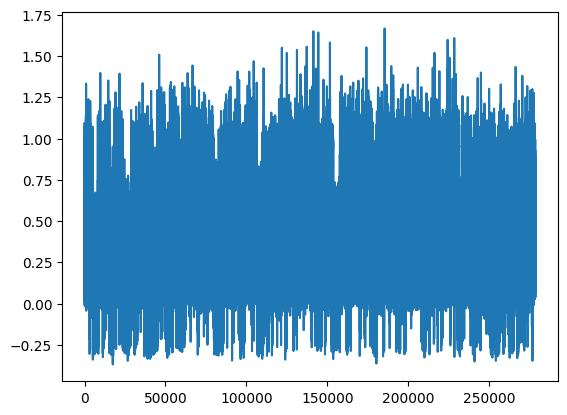

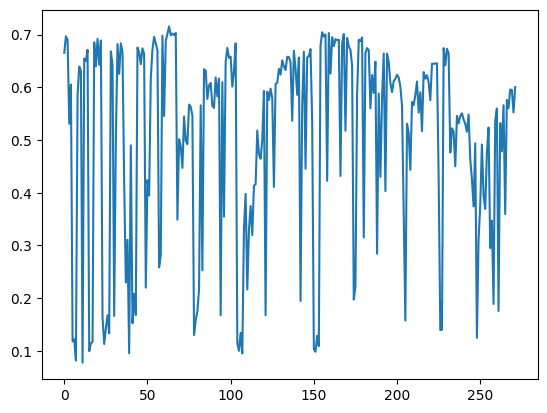

[PPO] Epoch 0: Loss=55.4120, Policy=0.0074, Value=110.8643
[PPO] Epoch 10: Loss=35.4866, Policy=-0.0031, Value=71.0282
[PPO] Epoch 20: Loss=23.8278, Policy=-0.0194, Value=47.7439
[PPO] Epoch 30: Loss=16.7275, Policy=-0.0328, Value=33.5722
Approx KL Learned: 0.050373196601867676
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 69/100 — steps: 4096


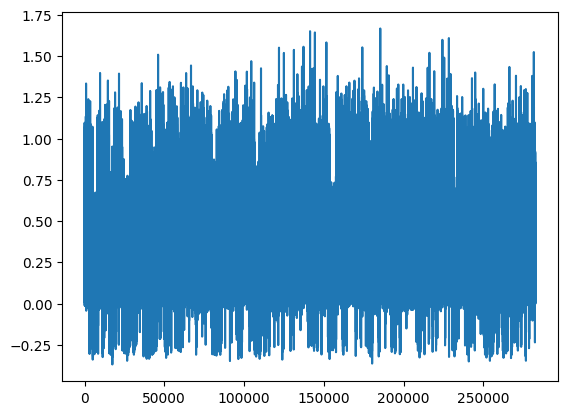

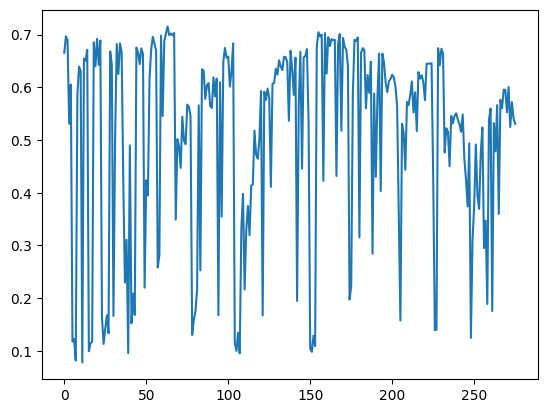

[PPO] Epoch 0: Loss=39.0135, Policy=0.0109, Value=78.0560
[PPO] Epoch 10: Loss=22.6584, Policy=-0.0091, Value=45.3821
[PPO] Epoch 20: Loss=13.0397, Policy=-0.0304, Value=26.1890
[PPO] Epoch 30: Loss=7.7587, Policy=-0.0429, Value=15.6566
Approx KL Learned: 0.08811195939779282
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 70/100 — steps: 4096


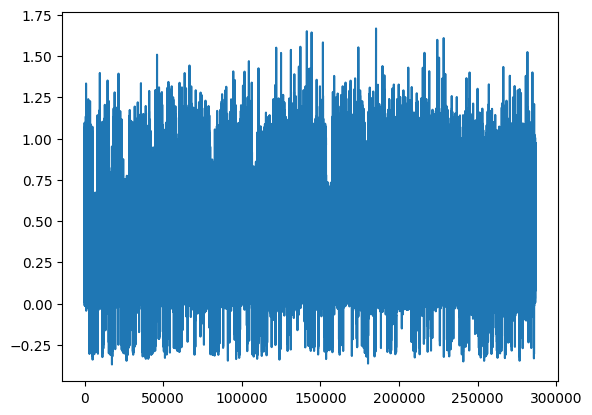

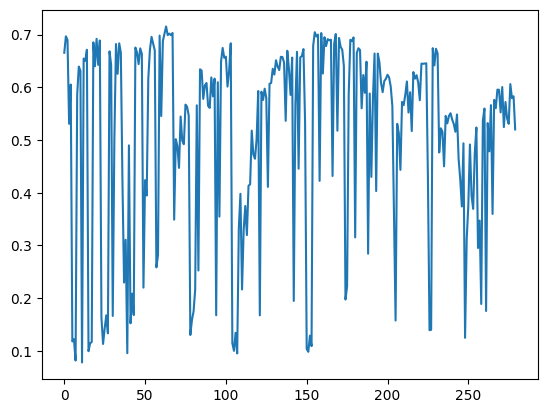

[PPO] Epoch 0: Loss=50.9472, Policy=0.0082, Value=101.9263
[PPO] Epoch 10: Loss=32.2288, Policy=-0.0077, Value=64.5197
[PPO] Epoch 20: Loss=20.8559, Policy=-0.0223, Value=41.8046
[PPO] Epoch 30: Loss=12.8878, Policy=-0.0299, Value=25.8886
Approx KL Learned: 0.06055639684200287
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 71/100 — steps: 4096


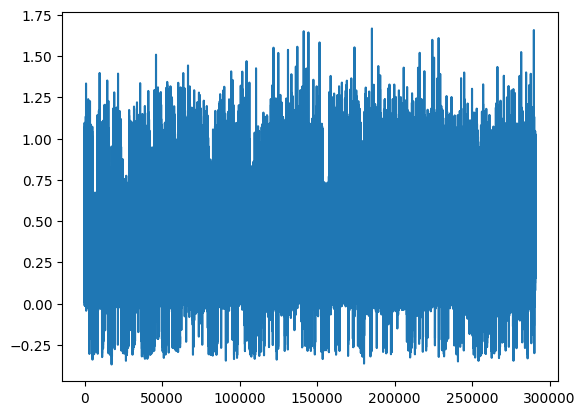

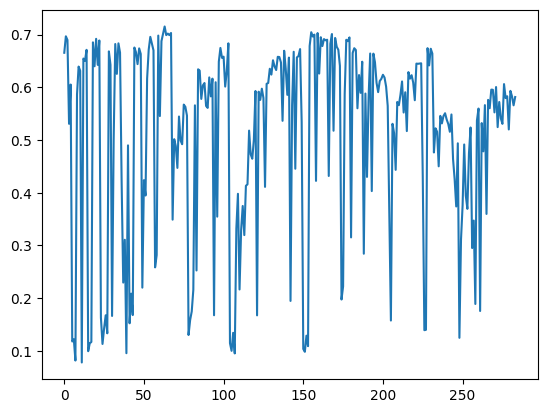

[PPO] Epoch 0: Loss=56.3568, Policy=0.0128, Value=112.7466
[PPO] Epoch 10: Loss=28.4806, Policy=-0.0071, Value=57.0278
[PPO] Epoch 20: Loss=18.1563, Policy=-0.0261, Value=36.4223
[PPO] Epoch 30: Loss=13.1240, Policy=-0.0431, Value=26.3925
Approx KL Learned: 0.0596044659614563
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 72/100 — steps: 4096


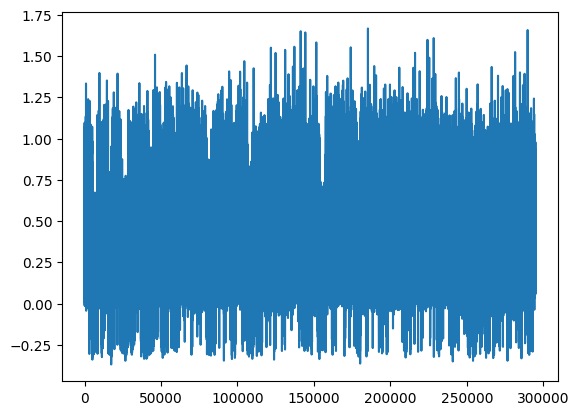

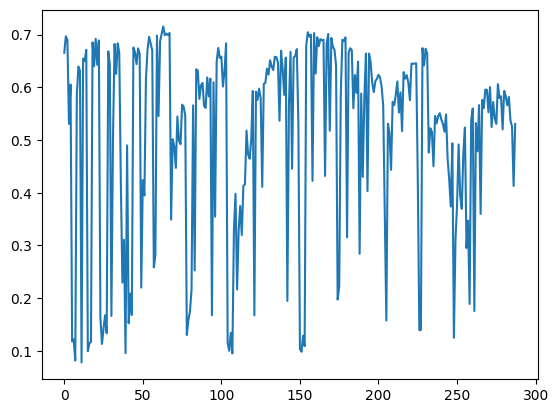

[PPO] Epoch 0: Loss=57.7910, Policy=0.0123, Value=115.6150
[PPO] Epoch 10: Loss=35.2440, Policy=-0.0151, Value=70.5687
[PPO] Epoch 20: Loss=22.4559, Policy=-0.0268, Value=45.0136
[PPO] Epoch 30: Loss=15.2797, Policy=-0.0419, Value=30.6964
Approx KL Learned: 0.07154214382171631
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 73/100 — steps: 4096


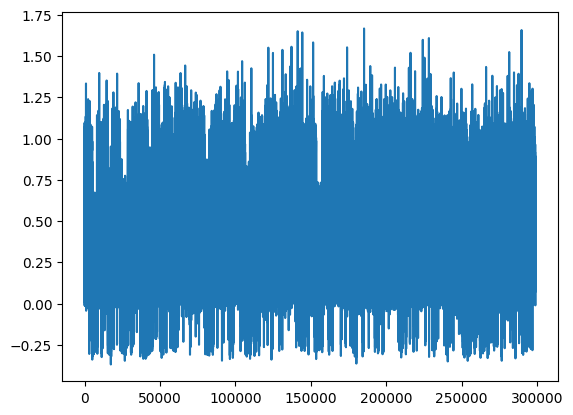

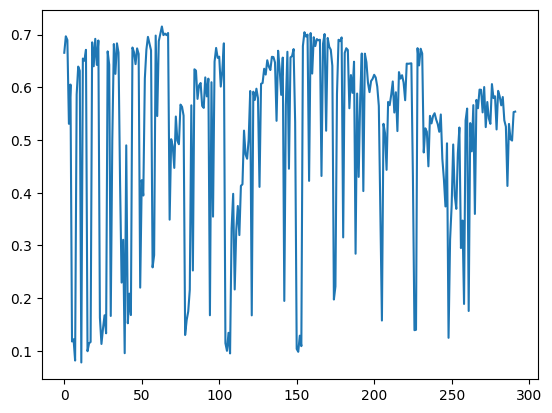

[PPO] Epoch 0: Loss=62.9483, Policy=0.0105, Value=125.9340
[PPO] Epoch 10: Loss=31.5964, Policy=-0.0077, Value=63.2593
[PPO] Epoch 20: Loss=21.1553, Policy=-0.0217, Value=42.4097
[PPO] Epoch 30: Loss=15.4998, Policy=-0.0376, Value=31.1308
Approx KL Learned: 0.05281801521778107
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 74/100 — steps: 4096


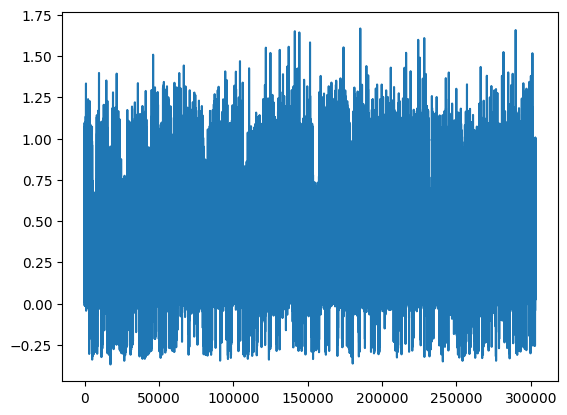

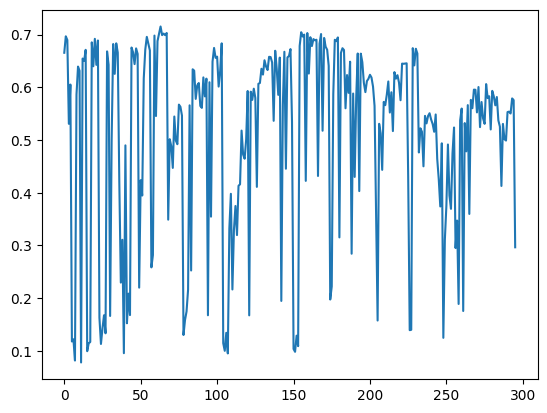

[PPO] Epoch 0: Loss=54.2631, Policy=0.0112, Value=108.5535
[PPO] Epoch 10: Loss=24.2301, Policy=-0.0110, Value=48.5315
[PPO] Epoch 20: Loss=14.6592, Policy=-0.0318, Value=29.4314
[PPO] Epoch 30: Loss=9.7685, Policy=-0.0481, Value=19.6834
Approx KL Learned: 0.07596525549888611
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 75/100 — steps: 4096


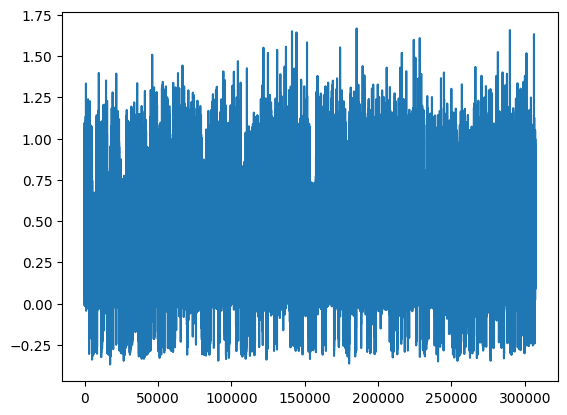

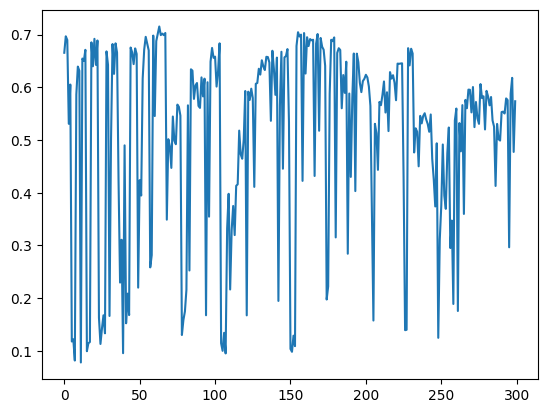

[PPO] Epoch 0: Loss=48.5075, Policy=0.0134, Value=97.0344
[PPO] Epoch 10: Loss=25.4162, Policy=0.0007, Value=50.8748
[PPO] Epoch 20: Loss=17.2348, Policy=-0.0213, Value=34.5554
[PPO] Epoch 30: Loss=13.2472, Policy=-0.0380, Value=26.6194
Approx KL Learned: 0.0719812661409378
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 76/100 — steps: 4096


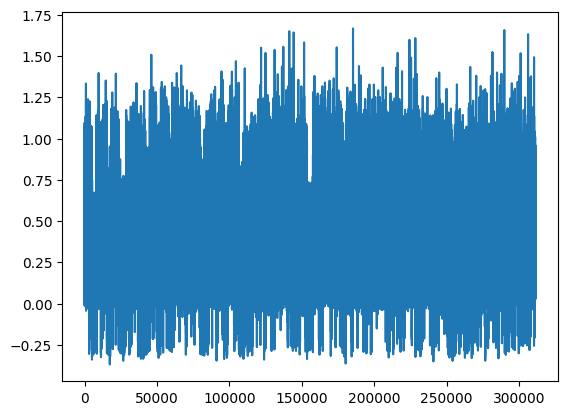

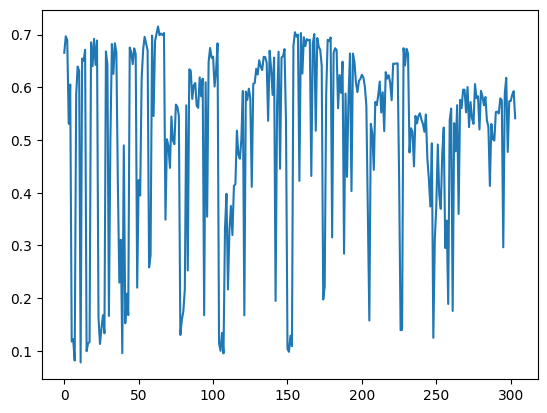

[PPO] Epoch 0: Loss=106.3659, Policy=0.0155, Value=212.7470
[PPO] Epoch 10: Loss=48.7387, Policy=0.0059, Value=97.5110
[PPO] Epoch 20: Loss=27.7931, Policy=-0.0128, Value=55.6581
[PPO] Epoch 30: Loss=17.9823, Policy=-0.0258, Value=36.0632
Approx KL Learned: 0.05419826880097389
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 77/100 — steps: 4096


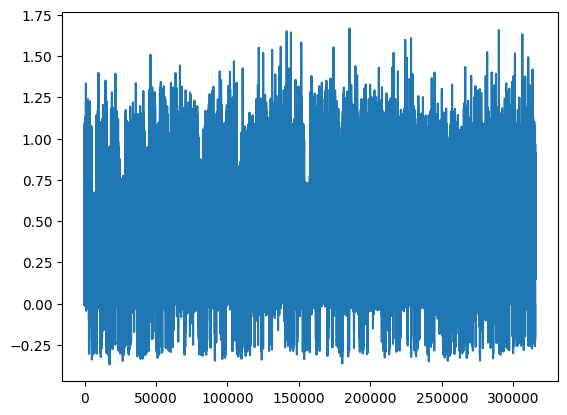

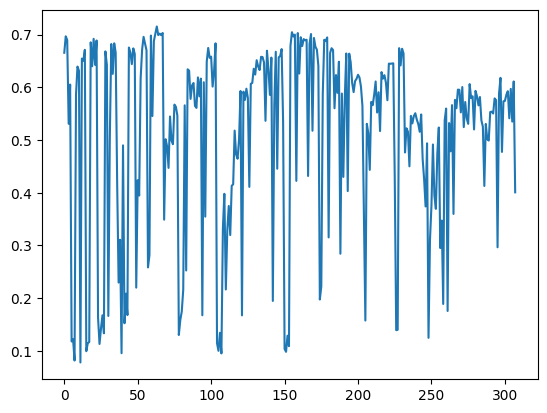

[PPO] Epoch 0: Loss=50.6109, Policy=0.0118, Value=101.2419
[PPO] Epoch 10: Loss=22.7271, Policy=-0.0114, Value=45.5184
[PPO] Epoch 20: Loss=13.8691, Policy=-0.0357, Value=27.8533
[PPO] Epoch 30: Loss=9.9505, Policy=-0.0375, Value=20.0293
Approx KL Learned: 0.1677965521812439
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 78/100 — steps: 4096


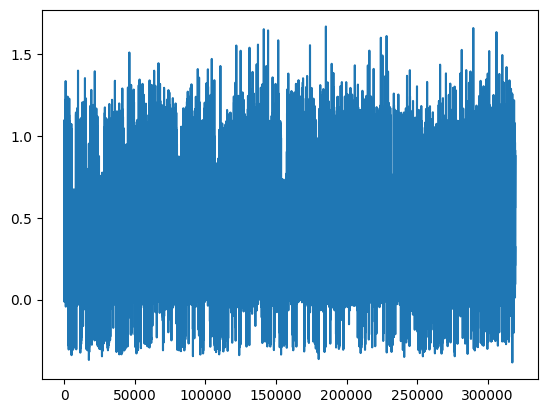

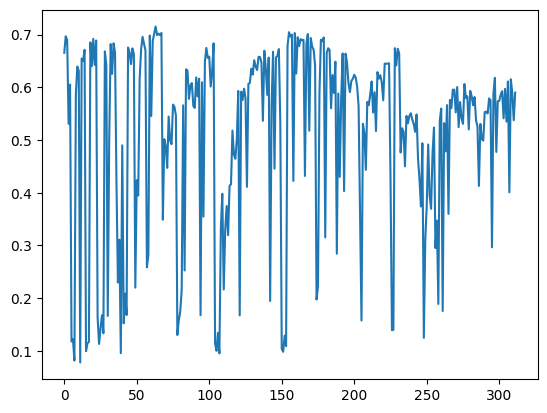

[PPO] Epoch 0: Loss=40.4880, Policy=0.0084, Value=80.9984
[PPO] Epoch 10: Loss=18.9089, Policy=0.0046, Value=37.8494
[PPO] Epoch 20: Loss=11.7219, Policy=-0.0180, Value=23.5179
[PPO] Epoch 30: Loss=8.6652, Policy=-0.0337, Value=17.4400
Approx KL Learned: 0.09768091142177582
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 79/100 — steps: 4096


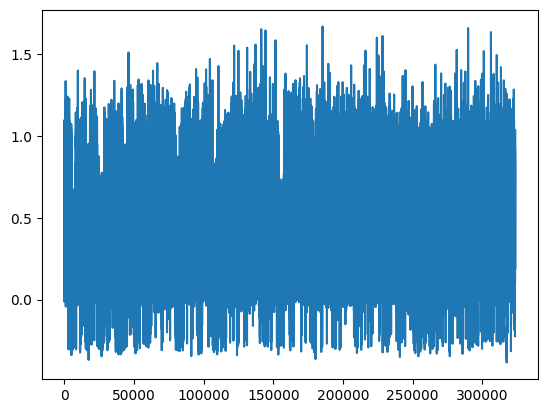

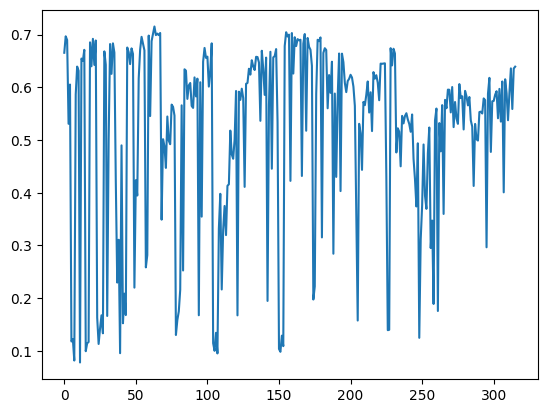

[PPO] Epoch 0: Loss=68.2060, Policy=0.0119, Value=136.4480
[PPO] Epoch 10: Loss=50.4063, Policy=-0.0013, Value=100.8751
[PPO] Epoch 20: Loss=32.9001, Policy=-0.0085, Value=65.8787
[PPO] Epoch 30: Loss=27.2246, Policy=-0.0326, Value=54.5711
Approx KL Learned: 0.052801020443439484
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 80/100 — steps: 4096


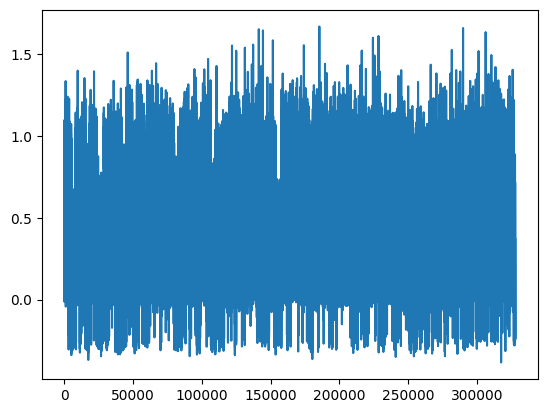

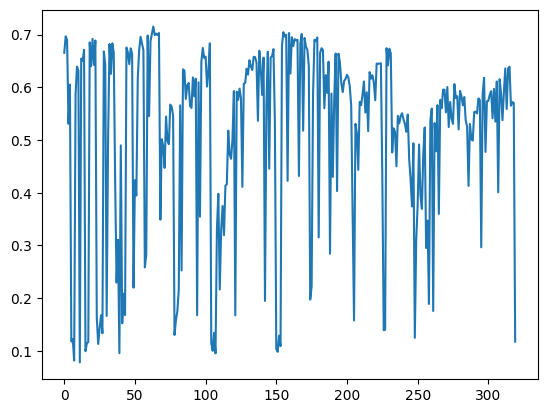

[PPO] Epoch 0: Loss=77.4000, Policy=0.0103, Value=154.8336
[PPO] Epoch 10: Loss=43.5433, Policy=-0.0049, Value=87.1470
[PPO] Epoch 20: Loss=32.1428, Policy=-0.0161, Value=64.3691
[PPO] Epoch 30: Loss=27.3524, Policy=-0.0256, Value=54.8084
Approx KL Learned: 0.03990441933274269
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 81/100 — steps: 4096


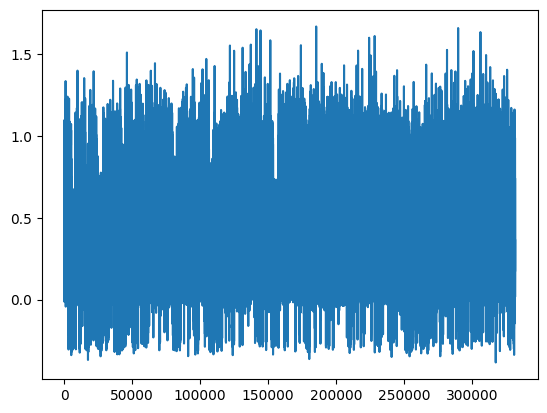

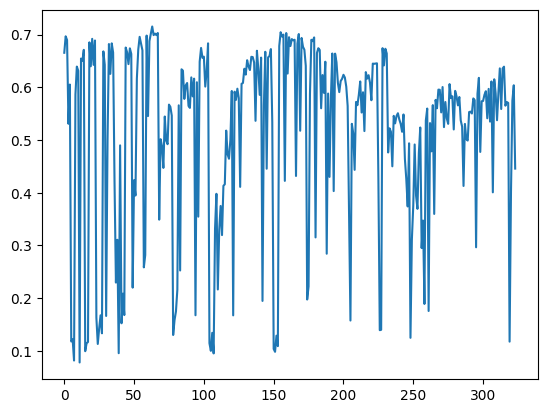

[PPO] Epoch 0: Loss=56.5279, Policy=0.0085, Value=113.0849
[PPO] Epoch 10: Loss=35.1457, Policy=-0.0114, Value=70.3551
[PPO] Epoch 20: Loss=22.9789, Policy=-0.0305, Value=46.0612
[PPO] Epoch 30: Loss=15.9107, Policy=-0.0416, Value=31.9519
Approx KL Learned: 0.07593213021755219
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 82/100 — steps: 4096


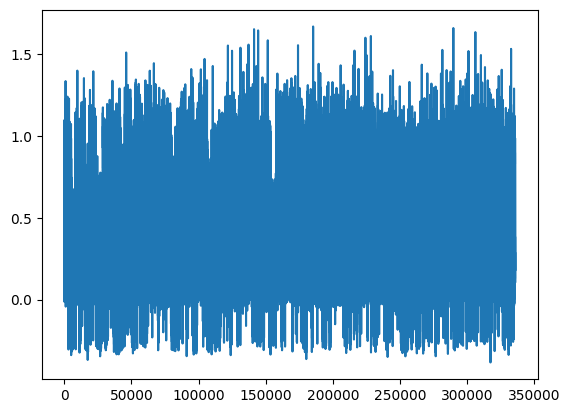

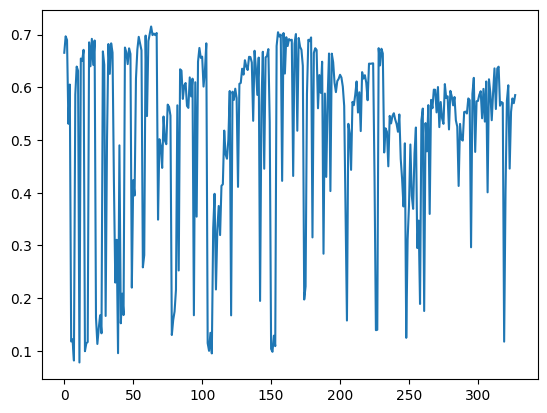

[PPO] Epoch 0: Loss=38.3610, Policy=0.0068, Value=76.7523
[PPO] Epoch 10: Loss=18.0557, Policy=-0.0042, Value=36.1613
[PPO] Epoch 20: Loss=12.2720, Policy=-0.0307, Value=24.6507
[PPO] Epoch 30: Loss=9.7388, Policy=-0.0244, Value=19.5641
Approx KL Learned: 0.1434696912765503
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 83/100 — steps: 4096


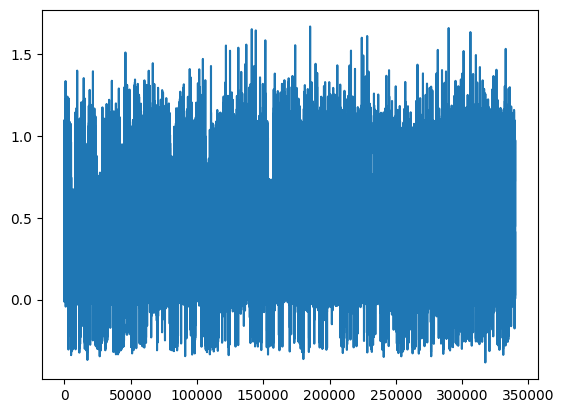

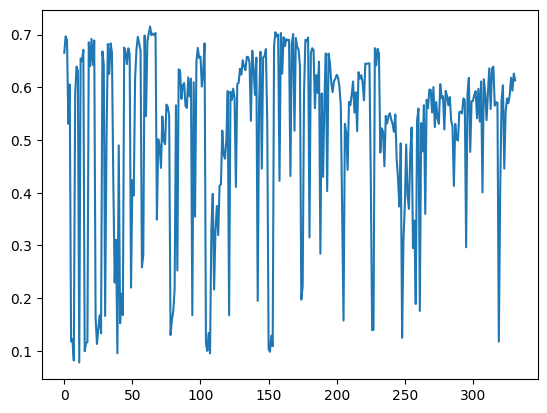

[PPO] Epoch 0: Loss=101.7445, Policy=0.0139, Value=203.5226
[PPO] Epoch 10: Loss=65.1879, Policy=0.0044, Value=130.4244
[PPO] Epoch 20: Loss=45.0337, Policy=-0.0133, Value=90.1531
[PPO] Epoch 30: Loss=32.5179, Policy=-0.0273, Value=65.1502
Approx KL Learned: 0.0489533394575119
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 84/100 — steps: 4096


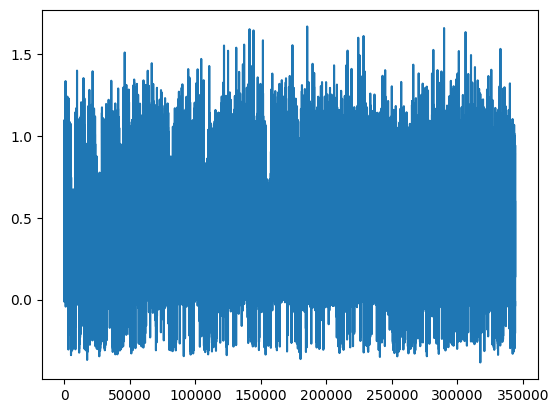

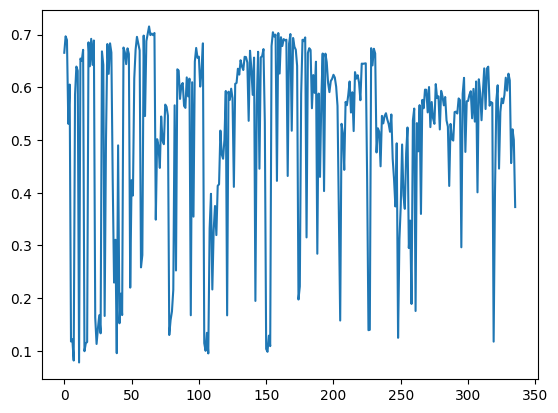

[PPO] Epoch 0: Loss=127.4540, Policy=0.0073, Value=254.9624
[PPO] Epoch 10: Loss=43.1115, Policy=-0.0034, Value=86.2965
[PPO] Epoch 20: Loss=25.0906, Policy=-0.0237, Value=50.2957
[PPO] Epoch 30: Loss=16.6950, Policy=-0.0360, Value=33.5293
Approx KL Learned: 0.03566044196486473
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 85/100 — steps: 4096


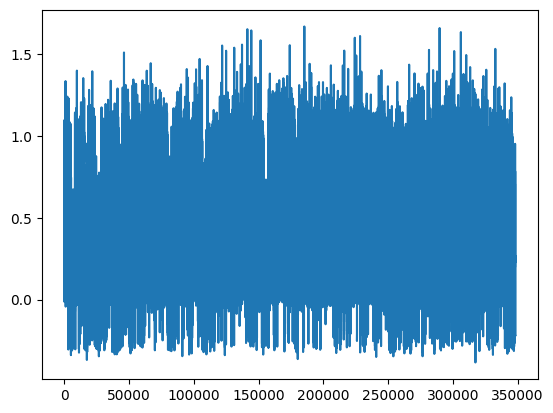

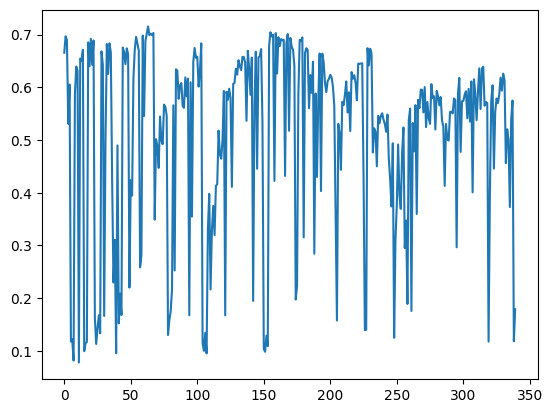

[PPO] Epoch 0: Loss=58.2742, Policy=0.0109, Value=116.5836
[PPO] Epoch 10: Loss=40.8227, Policy=-0.0016, Value=81.7029
[PPO] Epoch 20: Loss=25.0438, Policy=-0.0175, Value=50.1758
[PPO] Epoch 30: Loss=18.2697, Policy=-0.0317, Value=36.6575
Approx KL Learned: 0.05789470672607422
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 86/100 — steps: 4096


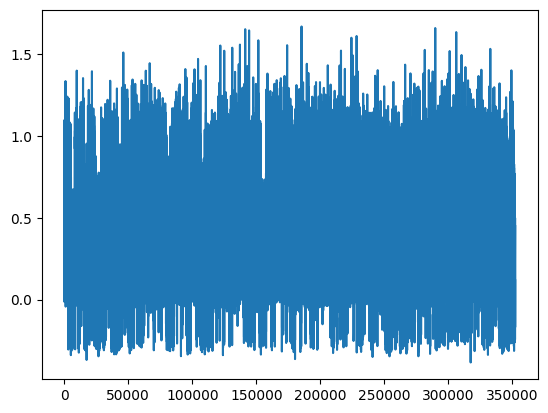

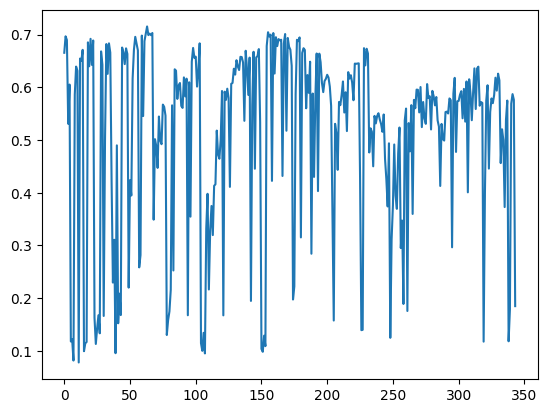

[PPO] Epoch 0: Loss=64.5567, Policy=0.0029, Value=129.1462
[PPO] Epoch 10: Loss=26.1258, Policy=-0.0032, Value=52.2951
[PPO] Epoch 20: Loss=18.2363, Policy=-0.0142, Value=36.5389
[PPO] Epoch 30: Loss=12.5612, Policy=-0.0237, Value=25.2096
Approx KL Learned: 0.05258613079786301
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 87/100 — steps: 4096


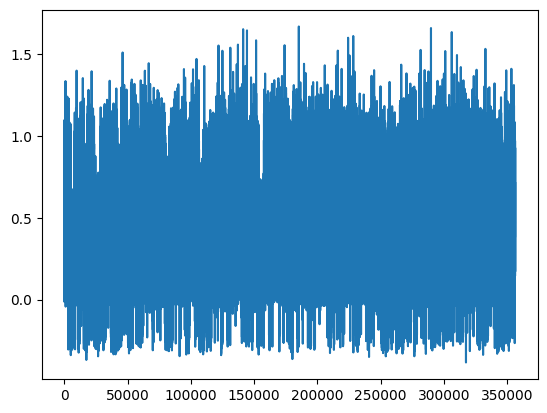

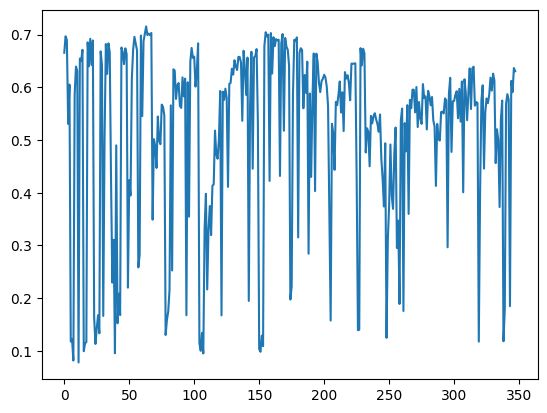

[PPO] Epoch 0: Loss=89.5307, Policy=0.0130, Value=179.0905
[PPO] Epoch 10: Loss=35.6387, Policy=-0.0003, Value=71.3313
[PPO] Epoch 20: Loss=19.5650, Policy=-0.0173, Value=39.2173
[PPO] Epoch 30: Loss=12.8463, Policy=-0.0349, Value=25.8127
Approx KL Learned: 0.055302008986473083
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 88/100 — steps: 4096


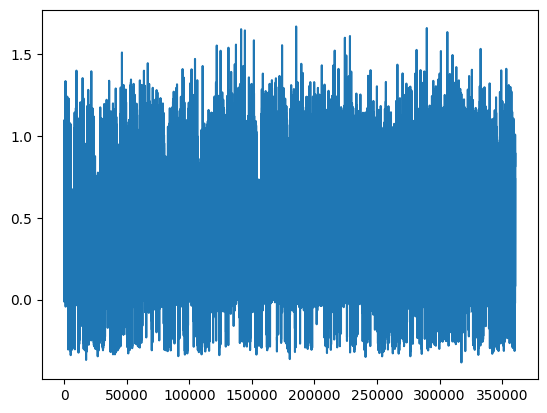

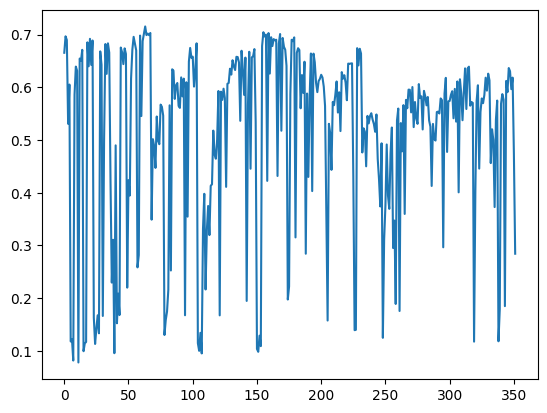

[PPO] Epoch 0: Loss=85.6766, Policy=0.0079, Value=171.3852
[PPO] Epoch 10: Loss=32.5616, Policy=0.0039, Value=65.1612
[PPO] Epoch 20: Loss=18.6180, Policy=-0.0137, Value=37.3069
[PPO] Epoch 30: Loss=13.4824, Policy=-0.0268, Value=27.0633
Approx KL Learned: 0.03624960035085678
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 89/100 — steps: 4096


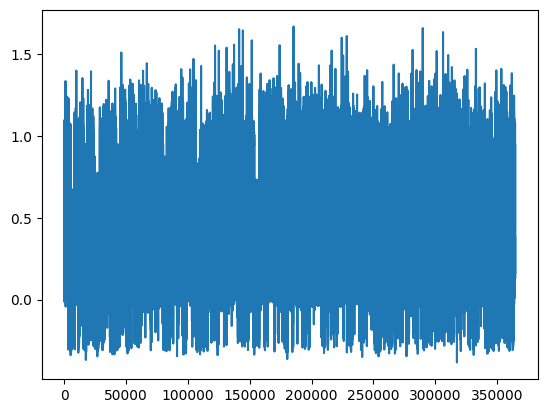

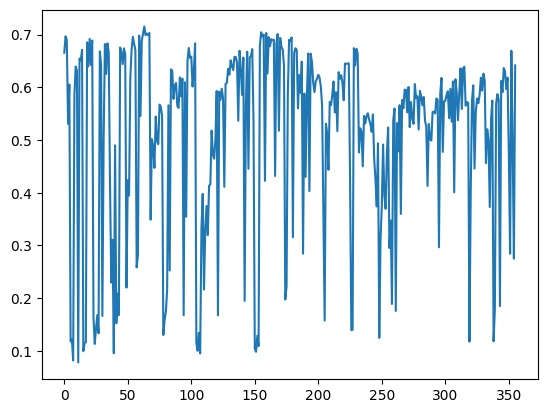

[PPO] Epoch 0: Loss=60.5913, Policy=0.0048, Value=121.1997
[PPO] Epoch 10: Loss=20.7084, Policy=-0.0067, Value=41.4529
[PPO] Epoch 20: Loss=13.6047, Policy=-0.0130, Value=27.2593
[PPO] Epoch 30: Loss=9.4596, Policy=-0.0171, Value=18.9814
Approx KL Learned: 0.049257561564445496
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 90/100 — steps: 4096


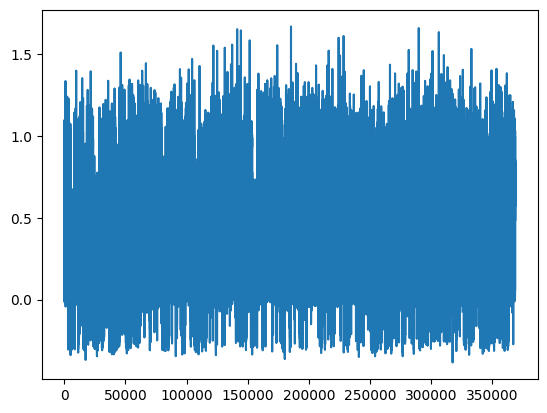

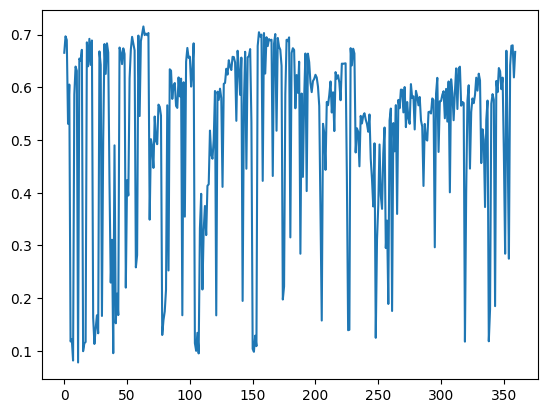

[PPO] Epoch 0: Loss=70.8205, Policy=0.0126, Value=141.6704
[PPO] Epoch 10: Loss=27.0269, Policy=0.0052, Value=54.0948
[PPO] Epoch 20: Loss=16.5539, Policy=-0.0096, Value=33.1793
[PPO] Epoch 30: Loss=11.8289, Policy=-0.0290, Value=23.7679
Approx KL Learned: 0.053208962082862854
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 91/100 — steps: 4096


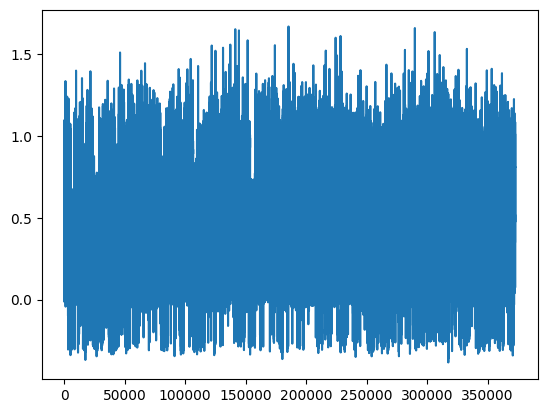

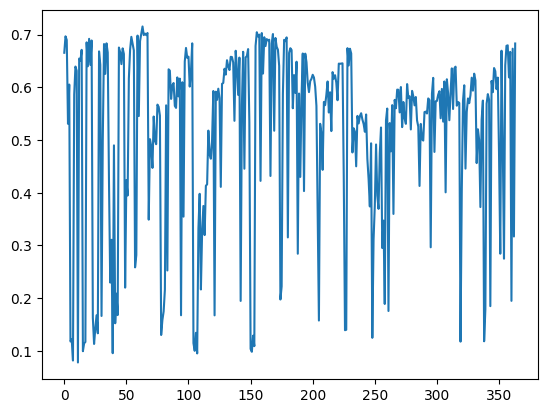

[PPO] Epoch 0: Loss=73.9815, Policy=0.0018, Value=147.9946
[PPO] Epoch 10: Loss=20.7198, Policy=-0.0014, Value=41.4775
[PPO] Epoch 20: Loss=13.7475, Policy=-0.0167, Value=27.5636
[PPO] Epoch 30: Loss=10.6838, Policy=-0.0262, Value=21.4542
Approx KL Learned: 0.02872096374630928
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 92/100 — steps: 4096


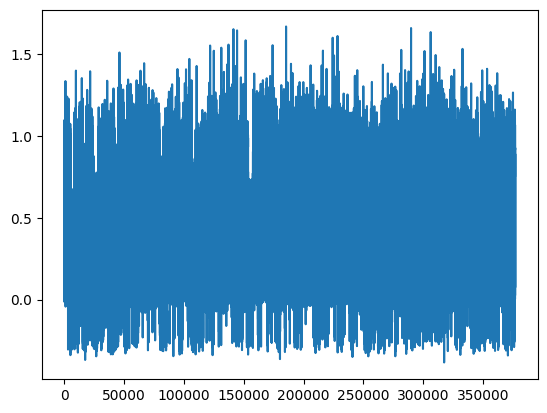

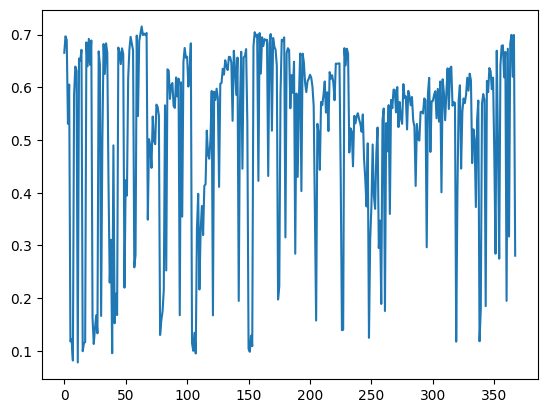

[PPO] Epoch 0: Loss=46.2052, Policy=0.0032, Value=92.4221
[PPO] Epoch 10: Loss=20.2731, Policy=-0.0029, Value=40.5683
[PPO] Epoch 20: Loss=6.8426, Policy=-0.0156, Value=13.7352
[PPO] Epoch 30: Loss=5.9795, Policy=-0.0237, Value=12.0266
Approx KL Learned: 0.07089592516422272
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 93/100 — steps: 4096


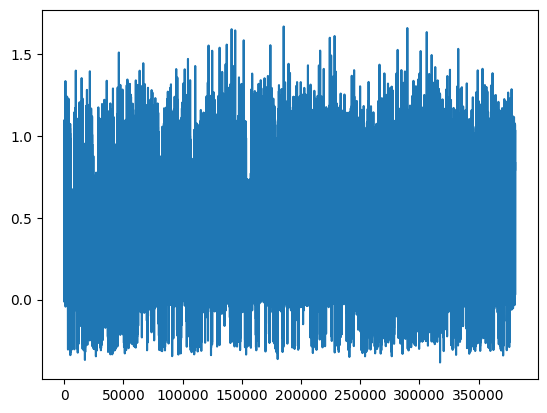

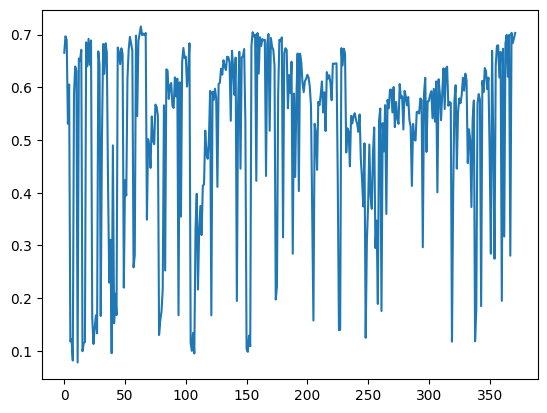

[PPO] Epoch 0: Loss=36.3429, Policy=0.0071, Value=72.6983
[PPO] Epoch 10: Loss=13.9833, Policy=-0.0023, Value=27.9938
[PPO] Epoch 20: Loss=10.1707, Policy=-0.0209, Value=20.4054
[PPO] Epoch 30: Loss=7.7987, Policy=-0.0326, Value=15.6878
Approx KL Learned: 0.06749658286571503
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 94/100 — steps: 4096


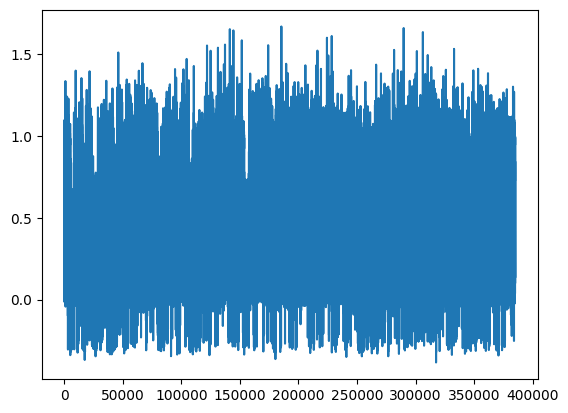

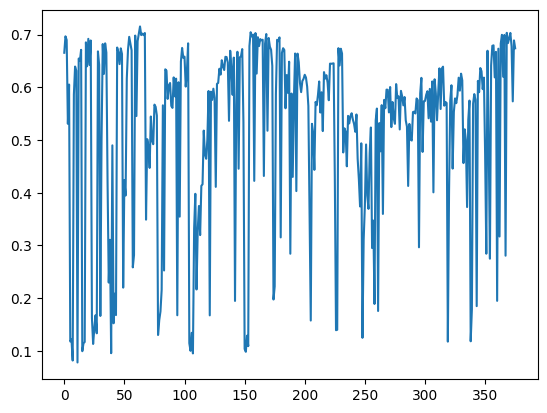

[PPO] Epoch 0: Loss=80.4959, Policy=0.0133, Value=160.9980
[PPO] Epoch 10: Loss=47.5354, Policy=-0.0011, Value=95.1027
[PPO] Epoch 20: Loss=28.2332, Policy=-0.0183, Value=56.5351
[PPO] Epoch 30: Loss=21.5890, Policy=-0.0280, Value=43.2694
Approx KL Learned: 0.06612670421600342
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 95/100 — steps: 4096


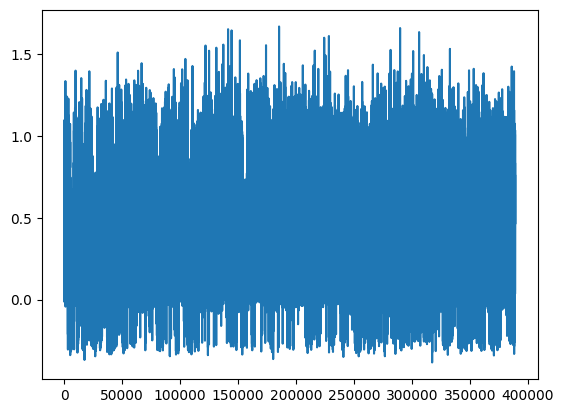

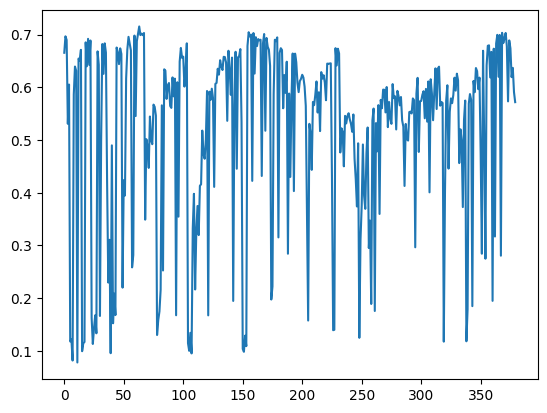

[PPO] Epoch 0: Loss=61.0227, Policy=0.0042, Value=122.0752
[PPO] Epoch 10: Loss=29.3960, Policy=-0.0116, Value=58.8492
[PPO] Epoch 20: Loss=20.4396, Policy=-0.0283, Value=40.9702
[PPO] Epoch 30: Loss=13.7848, Policy=-0.0404, Value=27.6850
Approx KL Learned: 0.05492907017469406
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 96/100 — steps: 4096


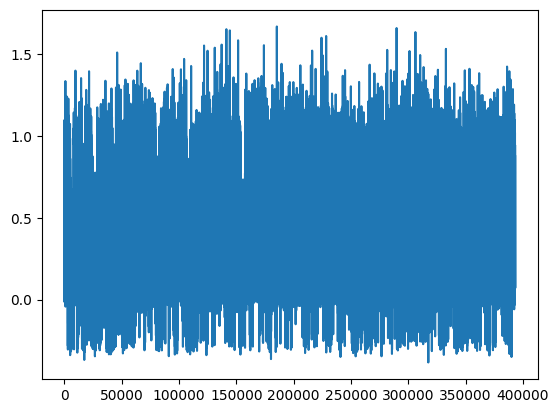

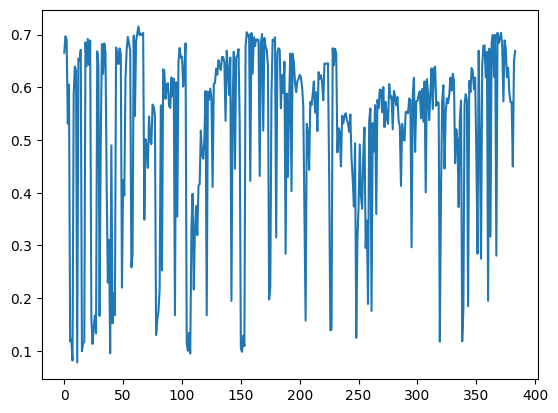

[PPO] Epoch 0: Loss=41.6288, Policy=0.0033, Value=83.2869
[PPO] Epoch 10: Loss=23.4485, Policy=-0.0139, Value=46.9598
[PPO] Epoch 20: Loss=18.1280, Policy=-0.0303, Value=36.3515
[PPO] Epoch 30: Loss=15.6990, Policy=-0.0381, Value=31.5085
Approx KL Learned: 0.054582931101322174
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 97/100 — steps: 4096


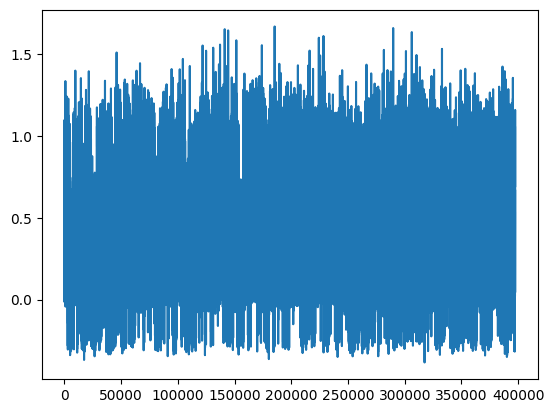

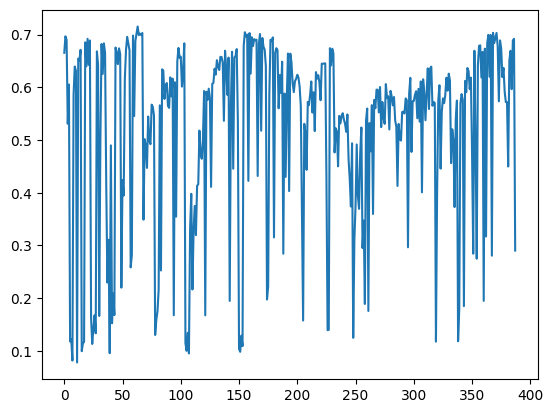

[PPO] Epoch 0: Loss=163.9905, Policy=0.0099, Value=328.0300
[PPO] Epoch 10: Loss=52.2690, Policy=0.0052, Value=104.5978
[PPO] Epoch 20: Loss=36.5123, Policy=-0.0064, Value=73.1080
[PPO] Epoch 30: Loss=23.2554, Policy=-0.0258, Value=46.6309
Approx KL Learned: 0.04291980341076851
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 98/100 — steps: 4096


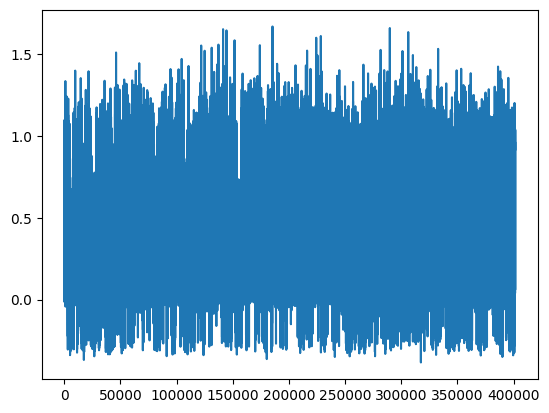

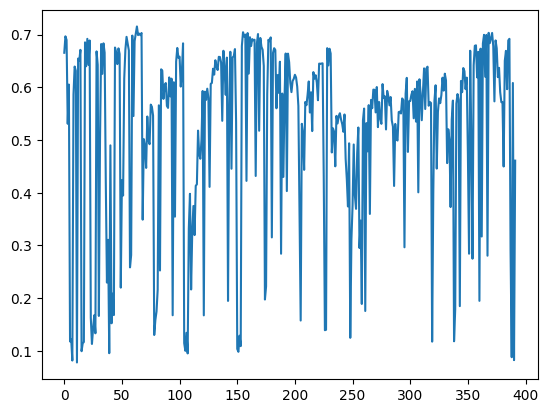

[PPO] Epoch 0: Loss=81.4435, Policy=0.0049, Value=162.8900
[PPO] Epoch 10: Loss=27.9850, Policy=0.0017, Value=55.9790
[PPO] Epoch 20: Loss=15.1106, Policy=-0.0026, Value=30.2430
[PPO] Epoch 30: Loss=11.3385, Policy=-0.0041, Value=22.7241
Approx KL Learned: 0.15455177426338196
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 99/100 — steps: 4096


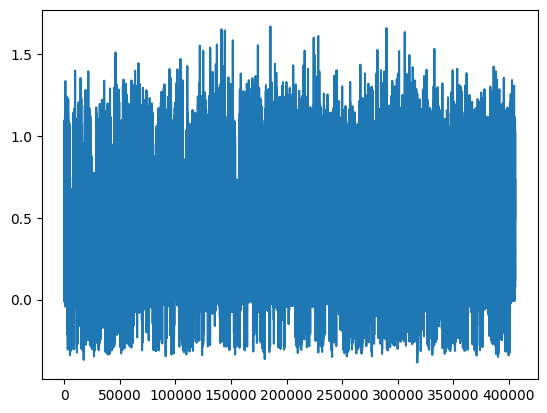

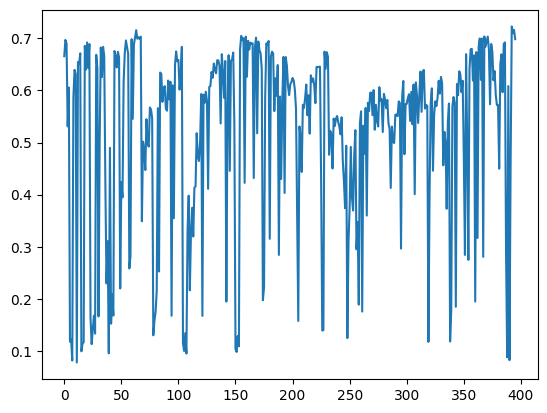

[PPO] Epoch 0: Loss=45.3342, Policy=0.0145, Value=90.6924
[PPO] Epoch 10: Loss=24.0703, Policy=-0.0046, Value=48.2029
[PPO] Epoch 20: Loss=17.8907, Policy=-0.0195, Value=35.8727
[PPO] Epoch 30: Loss=14.3878, Policy=-0.0335, Value=28.8984
Approx KL Learned: 0.11466702073812485
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 100/100 — steps: 4096


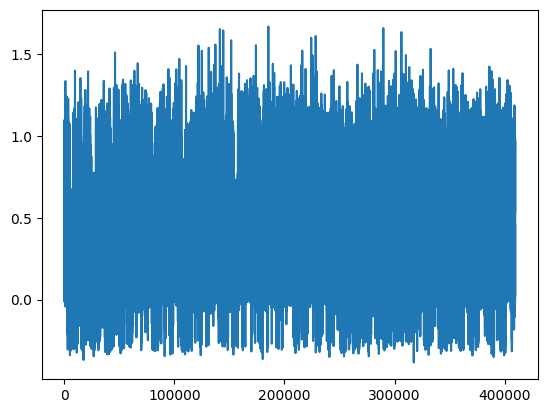

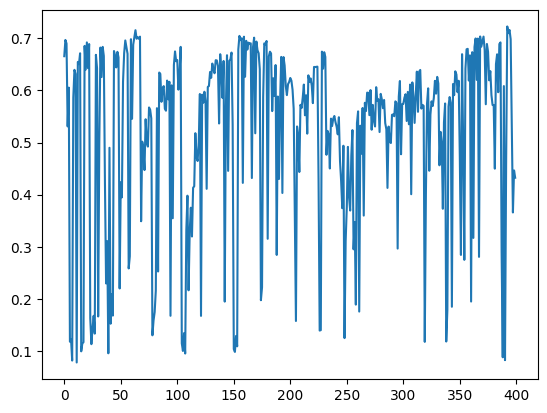

In [43]:
buf, rewards = train(controller, "clip_actor_critic_checkpoint_long_training.pt", ppo, clip_env, clip_actor_critic, 100)

In [62]:
from cons import ACTIONS
from collections import deque
import matplotlib.pyplot as plt
import numpy as np
from typing import Callable
import imageio


def inference(get_distribution: Callable[[torch.Tensor, ActorCritic], torch.distributions.Categorical], init_position: dict[str, float], env: Env, actor_critic: ActorCritic, plot=True):
    n = 256
    n_row = 32
    positions = []

    plt.figure(figsize=(n // n_row * 2, n_row * 2))
    event = teleport(controller, init_position)
    episode_seq = deque(maxlen=EPISODE_STEPS)
    actions_seq = deque(maxlen=EPISODE_STEPS)
    raw_obs = []
    for t in range(1, n + 1):
        positions.append([event.metadata["agent"]["position"]["x"], event.metadata["agent"]["position"]["z"]])
        with torch.no_grad():
            obs_t = ppo.obs_from_event(event)  # (C,H,W)
            obs_t_encoded = actor_critic.actor_critic_encoder(obs_t.unsqueeze(0).unsqueeze(0)).squeeze(0).squeeze(0)
            obs_seq = torch.stack(list(episode_seq) + [obs_t_encoded], dim=0).unsqueeze(0).to(device=DEVICE)

        if len(actions_seq) == 0:
            actions_seq.append(torch.randint(0, NUM_ACTIONS, (1, 1)).item())
        
        actions_tensor = torch.tensor(actions_seq, dtype=torch.long, device=DEVICE).unsqueeze(0)
        dist = get_distribution(obs_seq, actions_tensor, actor_critic)
        action_idx = dist.sample()
        logp = dist.log_prob(action_idx)
        
        action_idx, logp = action_idx.item(), logp.item()
        event, reward = env.step_env(controller, action_idx)

        # store one step
        episode_seq.append(obs_t_encoded)
        actions_seq.append(action_idx)
        raw_obs.append(obs_t)
        
        if plot:
            # Plot frame and action
            plt.subplot(n_row, n // n_row, t)
            plt.title("action: " + ACTIONS[action_idx] + ", r: " + f"{reward:.2f}" + "\n, prob = " + f"{torch.exp(dist.log_prob(torch.tensor([0, 1, 2], device=DEVICE))).cpu().numpy()}", fontsize=5)
            plt.axis(False)
            plt.imshow(event.frame)
    if plot:
        plt.tight_layout()
        plt.show()
        
        # ---- Plot 2D trajectory of the agent ----
        positions = np.array(positions)
        plt.figure(figsize=(4, 4))
        plt.plot(positions[:, 0], positions[:, 1], "-o", markersize=3)
        plt.xlabel("x")
        plt.ylabel("z")
        plt.title("Agent trajectory over n steps")
        plt.grid(True)
        plt.show()

    return raw_obs

def inference_video_mp4(
    get_distribution,
    init_position: dict[str, float],
    env: Env,
    actor_critic: ActorCritic,
    video_path="rollout.mp4",
    fps=10,
    n_steps=256
):
    episode_seq = deque(maxlen=EPISODE_STEPS)
    actions_seq = deque(maxlen=EPISODE_STEPS)

    writer = imageio.get_writer(video_path, fps=fps)

    # start episode
    event = teleport(controller, init_position)
    positions = []

    for t in range(1, n_steps + 1):

        # ---- Add current frame to video ----
        writer.append_data(event.frame[:, :, ::-1])   # convert RGB→BGR if needed

        # track positions
        positions.append([
            event.metadata["agent"]["position"]["x"],
            event.metadata["agent"]["position"]["z"],
        ])

        with torch.no_grad():
            obs_t = ppo.obs_from_event(event)  
            obs_enc = actor_critic.actor_critic_encoder(
                obs_t.unsqueeze(0).unsqueeze(0)
            ).squeeze(0).squeeze(0)

            obs_seq = torch.stack(
                list(episode_seq) + [obs_enc], dim=0
            ).unsqueeze(0).to(DEVICE)

        # ---- Action ----
        if len(actions_seq) == 0:
            actions_seq.append(torch.randint(0, NUM_ACTIONS, ()).item())

        actions_tensor = torch.tensor(
            actions_seq, dtype=torch.long, device=DEVICE
        ).unsqueeze(0)

        dist = get_distribution(obs_seq, actions_tensor, actor_critic)
        action_idx = dist.sample().item()

        # ---- Step env ----
        event, reward = env.step_env(controller, action_idx)

        # ---- Store ----
        episode_seq.append(obs_enc)
        actions_seq.append(action_idx)

    writer.close()
    print(f"[🎞️] Saved video to {video_path}")

    return positions


def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
    logits, value = ppo.act_and_value(obs_seq, actions_tensor, clip_actor_critic)
    dist = torch.distributions.Categorical(logits=logits)
    return dist

event = teleport(controller)
init_pos = event.metadata["agent"]["position"]
inference_video_mp4(get_distributions, init_pos, clip_env, clip_actor_critic)

[🎞️] Saved video to rollout.mp4


[[1.0985212326049805, 1.6973028182983398],
 [1.0985212326049805, 1.9473028182983398],
 [1.0985212326049805, 2.19730281829834],
 [1.0985212326049805, 2.44730281829834],
 [1.0985212326049805, 2.44730281829834],
 [0.9735212326049805, 2.663809061050415],
 [0.9735212326049805, 2.663809061050415],
 [0.7570148706436157, 2.788809061050415],
 [0.7570148706436157, 2.788809061050415],
 [0.7570148706436157, 2.788809061050415],
 [0.7570148706436157, 2.788809061050415],
 [0.7570148706436157, 2.788809061050415],
 [0.7570148706436157, 2.788809061050415],
 [0.7570148706436157, 2.788809061050415],
 [0.7570148706436157, 2.788809061050415],
 [0.7570148706436157, 2.788809061050415],
 [0.7570148706436157, 2.788809061050415],
 [0.7570148706436157, 3.038809061050415],
 [0.7570148706436157, 3.038809061050415],
 [0.8820148706436157, 3.2553153038024902],
 [0.8820148706436157, 3.2553153038024902],
 [1.0985212326049805, 3.3803153038024902],
 [1.0985212326049805, 3.3803153038024902],
 [1.0985212326049805, 3.3803153

In [34]:
!pip install imageio imageio-ffmpeg

In [22]:
import clip

model, preprocess = clip.load("ViT-B/32", device=DEVICE)

In [23]:
import torch
import torch.nn.functional as F
import random

def preprocess_clip(x):
    # Resize to CLIP resolution
    x = F.interpolate(x, size=(224, 224), mode="bilinear", align_corners=False)
    # Normalize (CLIP standard mean/std)
    mean = torch.tensor([0.48145466, 0.4578275, 0.40821073], device=x.device).view(1, 3, 1, 1)
    std  = torch.tensor([0.26862954, 0.26130258, 0.27577711], device=x.device).view(1, 3, 1, 1)
    return (x - mean) / std

def get_average(input_img):
    # ---- 1. Sample 50 random images ----
    n = min(50, len(input_img))
    indices = random.sample(range(len(input_img)), n)
    imgs = torch.stack([input_img[i] for i in indices]).to(DEVICE)  # (50, 3, H, W)

    # ---- 2. Preprocess for CLIP ----
    imgs_clip = preprocess_clip(imgs).half()  # normalized, resized

    # ---- 3. Encode with CLIP visual encoder ----
    with torch.no_grad():
        embeds = model.visual(imgs_clip)       # (50, D)
        embeds = embeds / embeds.norm(dim=-1, keepdim=True)  # normalize to unit sphere

    # ---- 4. Compute cosine similarity ----
    sim_matrix = embeds @ embeds.T             # (50, 50)
    # Optional: remove self-similarity (diagonal = 1)
    sim_matrix.fill_diagonal_(0)

    # ---- 5. Summary statistics ----
    mean_sim = sim_matrix.mean().item()

    return mean_sim

for i in range(5):

    event = teleport(controller)
    init_pos = event.metadata["agent"]["position"]
    
    def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
        logits, value = ppo.act_and_value(obs_seq, actions_tensor, clip_actor_critic)
        dist = torch.distributions.Categorical(logits=logits)
        return dist

    policy = inference(get_distributions, init_pos, clip_env, clip_actor_critic, False)

    def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
        dist = torch.distributions.Categorical(probs=torch.tensor([0.5, 0.25, 0.25], device=DEVICE))
        return dist

    rand_policy = inference(get_distributions, init_pos, clip_env, clip_actor_critic, False)

    mean_policies = []
    mean_rands = []
    for i in range(10):
        mean_policy = get_average(policy)
        mean_rand = get_average(rand_policy)
        mean_policies.append(mean_policy)
        mean_rands.append(mean_rand)
    
    print("Policy: " + str(np.mean(np.array(mean_policies))))
    print("Rand: " + str(np.mean(np.array(mean_rands))))



Policy: 0.877001953125
Rand: 0.86337890625
Policy: 0.87021484375
Rand: 0.8068359375
Policy: 0.83388671875
Rand: 0.845361328125
Policy: 0.8791015625
Rand: 0.876318359375
Policy: 0.80693359375
Rand: 0.79033203125


<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>